In [ ]:
##HImachal_Precipitation


2020 - Processing bands 0 to 3
2020 - June (Normal: 101.1 mm): min=8.69, max=307.11


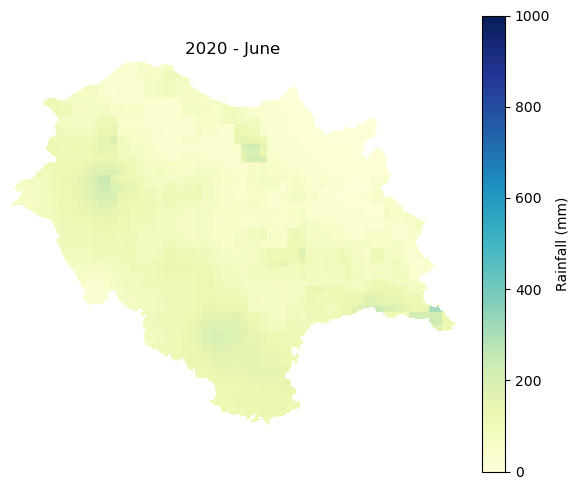

2020 - July (Normal: 255.9 mm): min=11.84, max=741.85


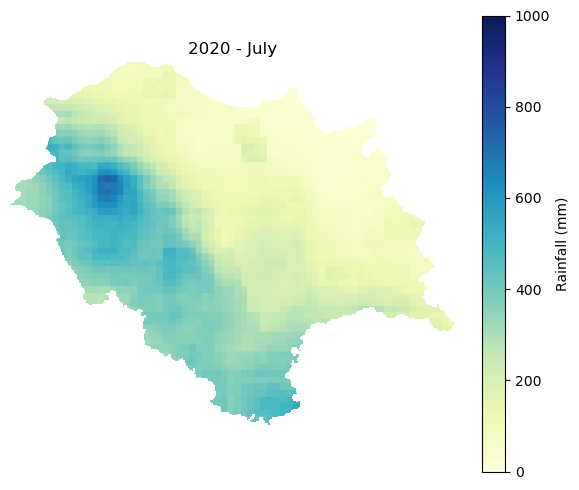

2020 - August (Normal: 256.8 mm): min=0.06, max=1070.24


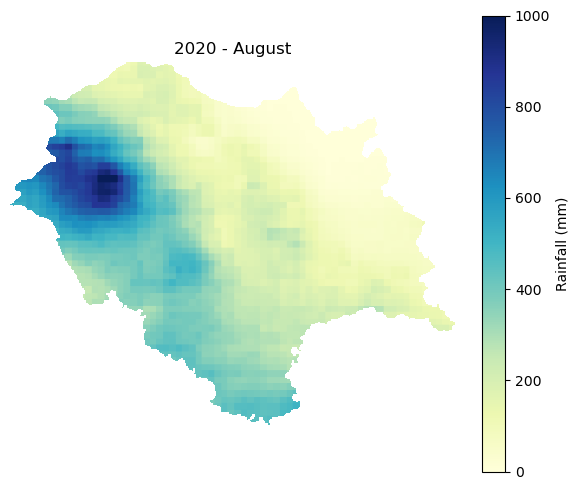

2020 - September (Normal: 120.6 mm): min=12.17, max=196.37


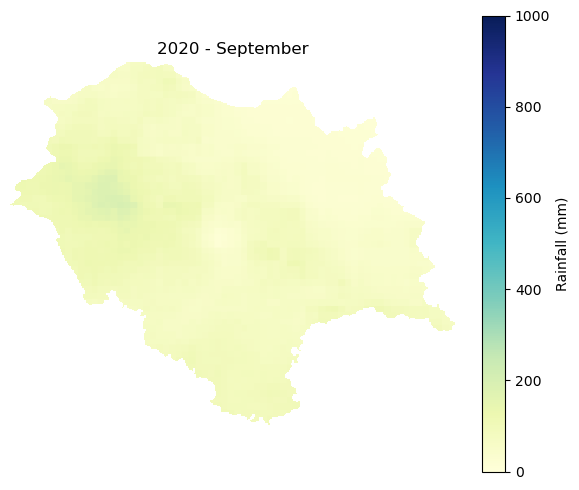

2020 - Total Rainfall (Himachal only): min=37.41 mm, max=2235.29 mm


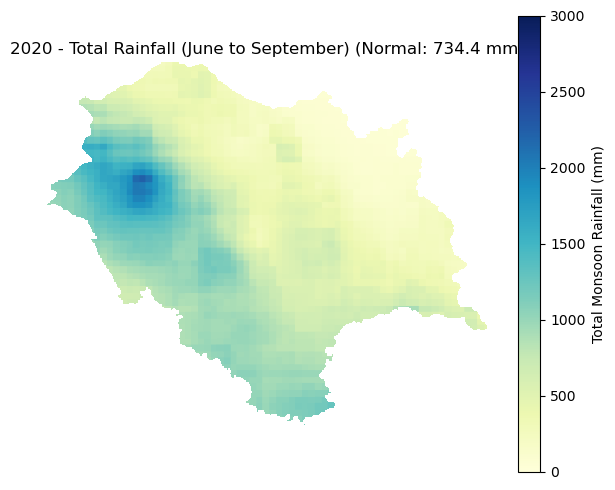


2021 - Processing bands 5 to 8
2021 - June (Normal: 101.1 mm): min=9.57, max=362.73


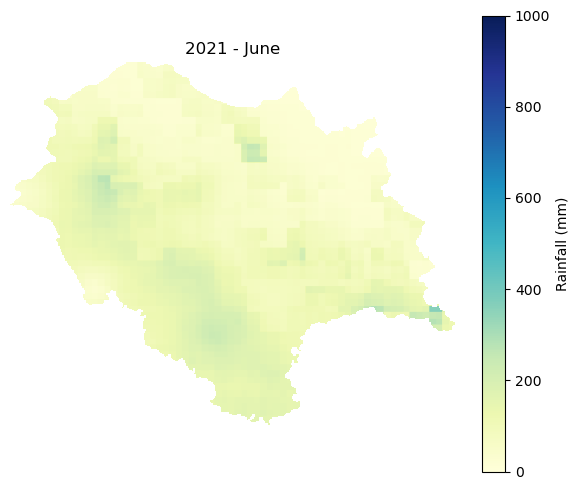

2021 - July (Normal: 255.9 mm): min=19.97, max=984.88


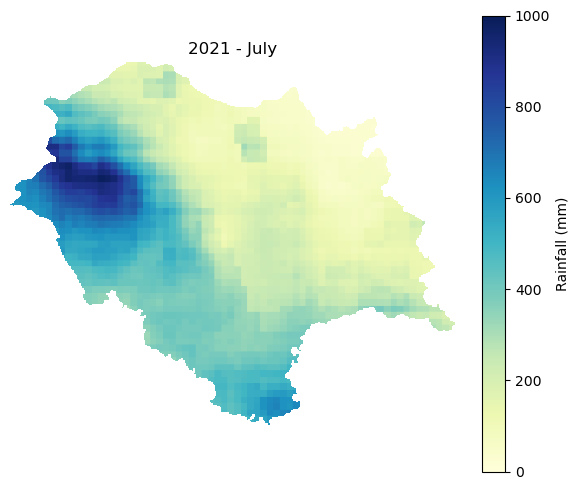

2021 - August (Normal: 256.8 mm): min=0.00, max=604.07


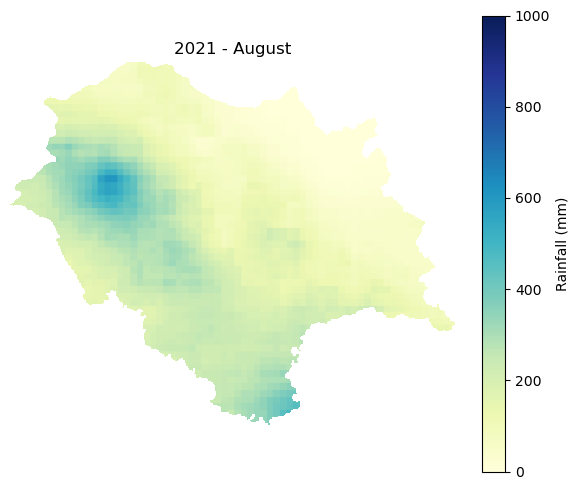

2021 - September (Normal: 120.6 mm): min=16.21, max=597.98


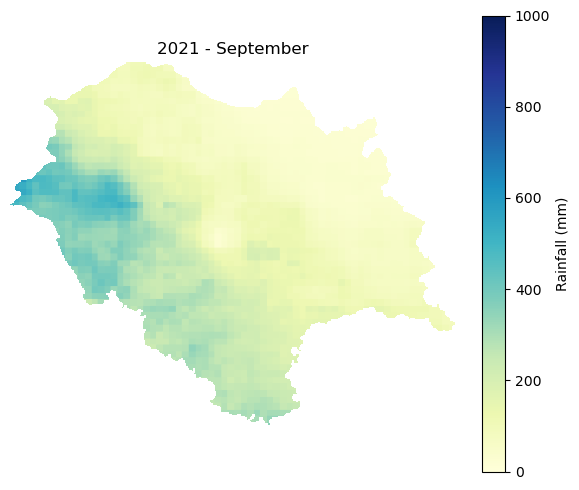

2021 - Total Rainfall (Himachal only): min=51.54 mm, max=2265.02 mm


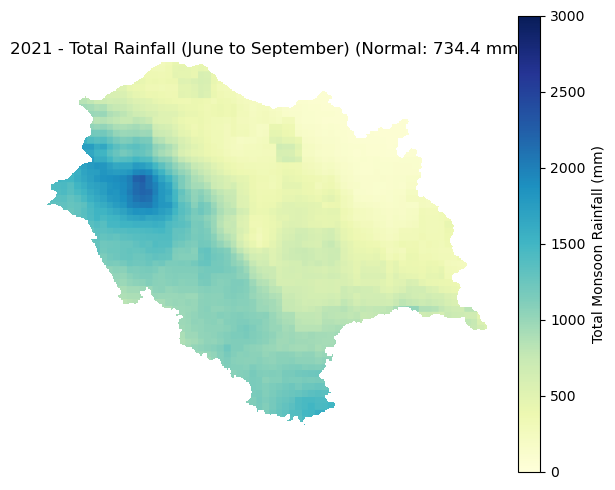


2022 - Processing bands 10 to 13
2022 - June (Normal: 101.1 mm): min=4.71, max=312.76


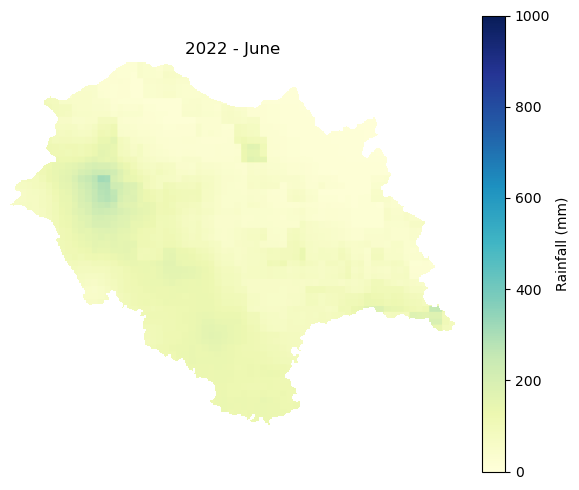

2022 - July (Normal: 255.9 mm): min=16.95, max=890.23


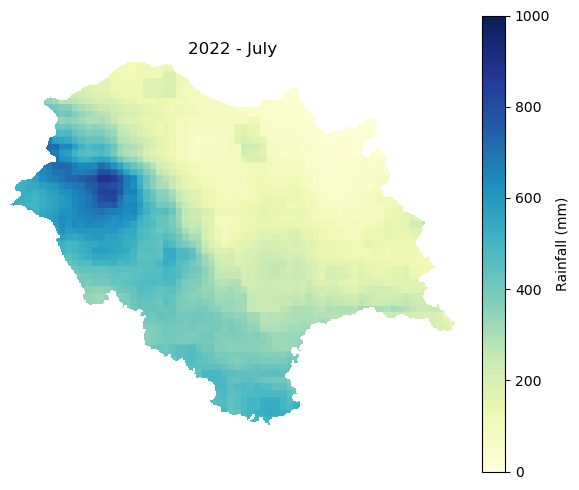

2022 - August (Normal: 256.8 mm): min=0.09, max=1019.83


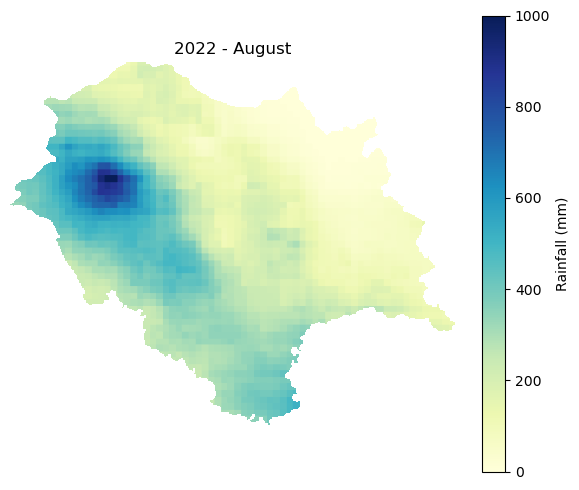

2022 - September (Normal: 120.6 mm): min=13.97, max=294.43


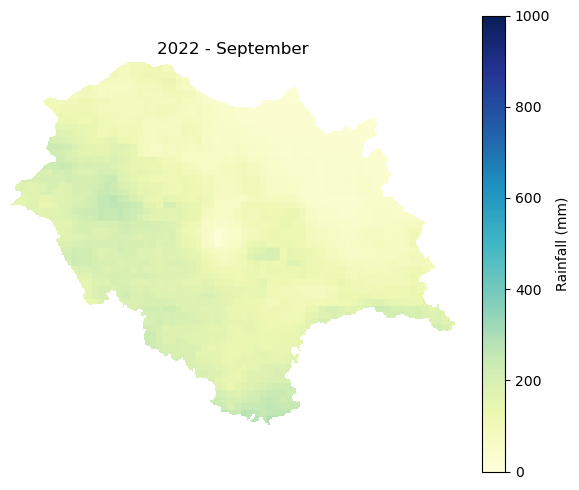

2022 - Total Rainfall (Himachal only): min=47.20 mm, max=2434.46 mm


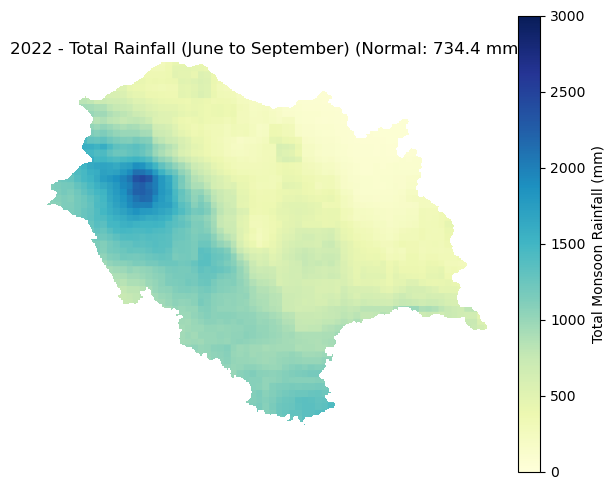


2023 - Processing bands 15 to 18
2023 - June (Normal: 101.1 mm): min=13.56, max=445.86


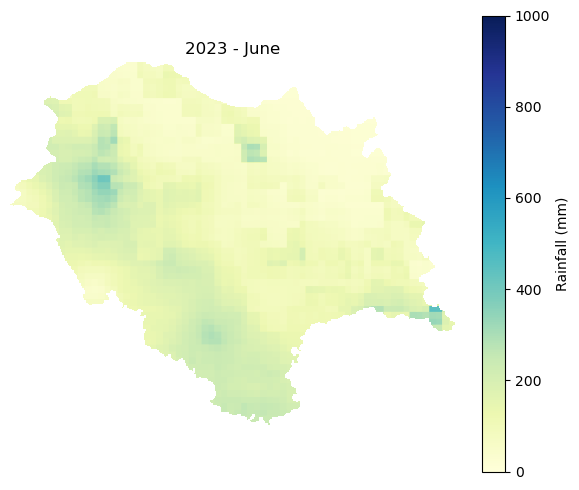

2023 - July (Normal: 255.9 mm): min=18.96, max=1106.22


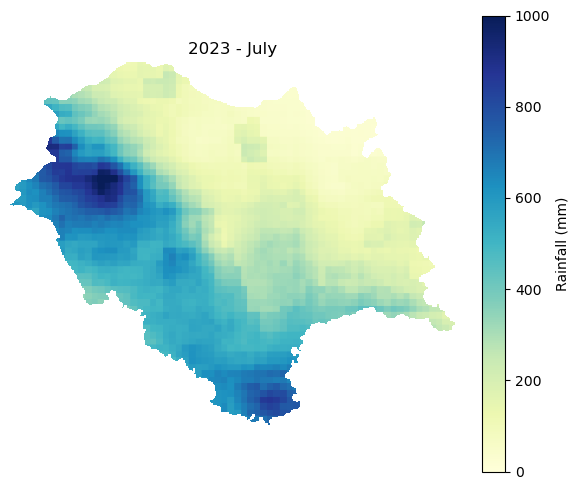

2023 - August (Normal: 256.8 mm): min=0.00, max=1112.44


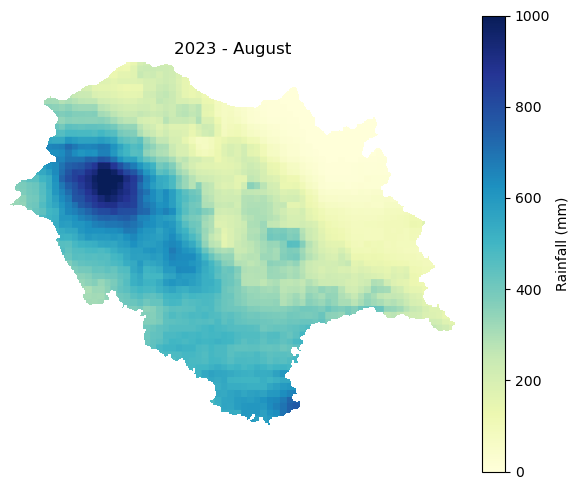

2023 - September (Normal: 120.6 mm): min=16.76, max=393.20


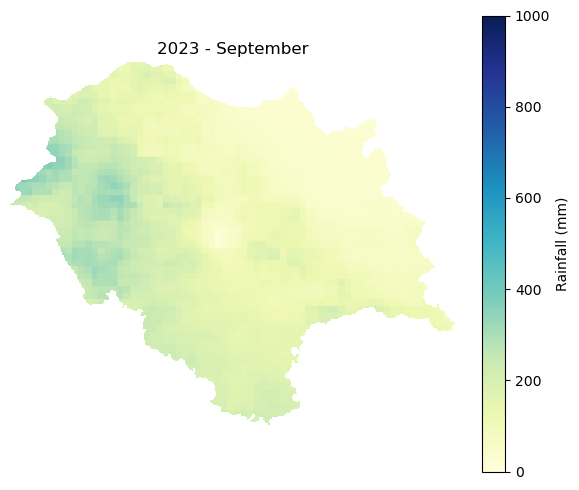

2023 - Total Rainfall (Himachal only): min=55.12 mm, max=2953.32 mm


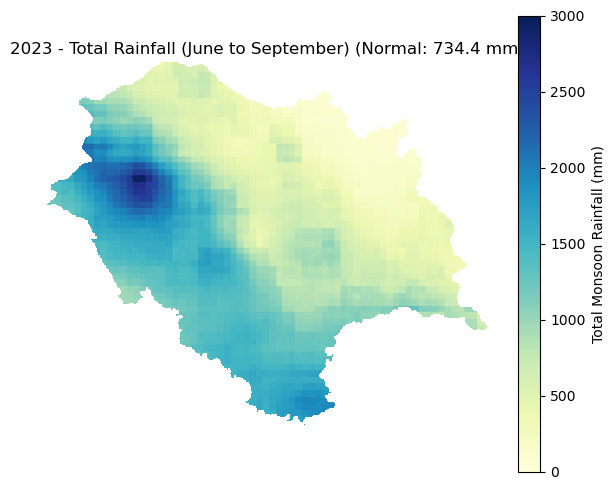


2024 - Processing bands 20 to 23
2024 - June (Normal: 101.1 mm): min=5.86, max=235.93


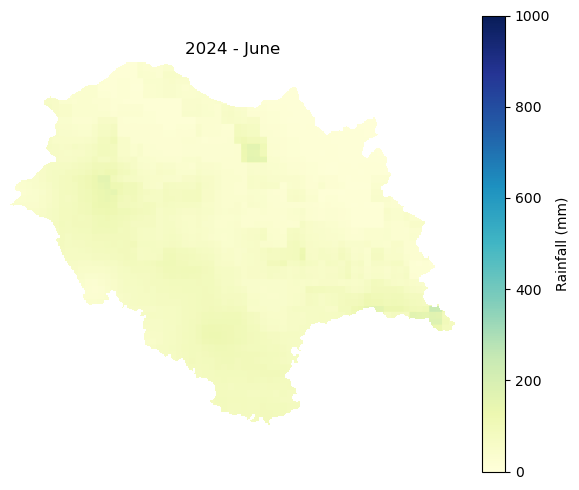

2024 - July (Normal: 255.9 mm): min=11.46, max=815.93


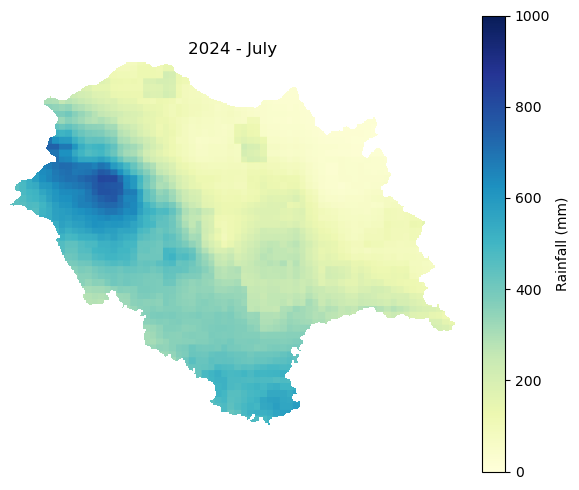

2024 - August (Normal: 256.8 mm): min=1.26, max=925.12


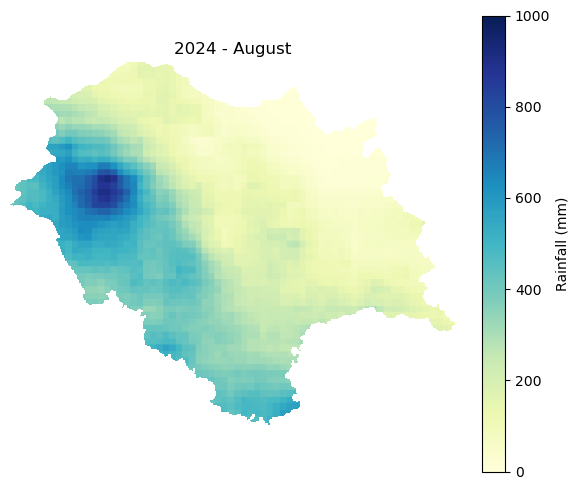

2024 - September (Normal: 120.6 mm): min=21.89, max=428.00


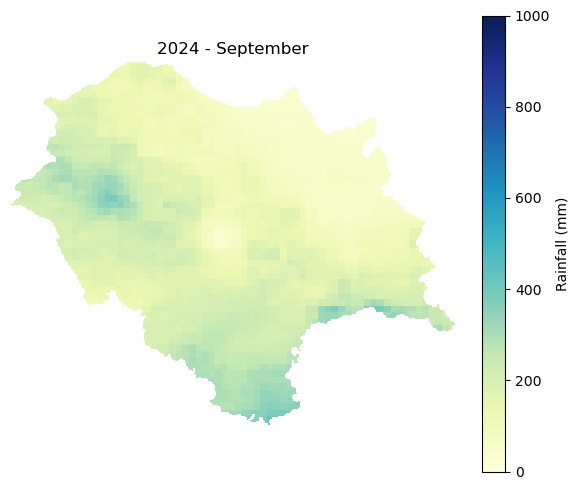

2024 - Total Rainfall (Himachal only): min=56.41 mm, max=2229.75 mm


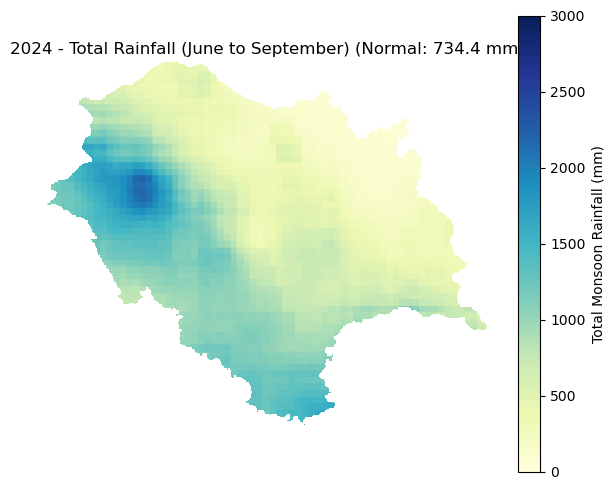

In [13]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from rasterio.mask import mask
from rasterio.io import MemoryFile
import os

# --- Configuration for Himachal ---
tiff_path = "Himachal_Y_Precipitation_CHIRPS.tif"
shapefile_path = "SateMask/gadm41_IND_1.shp"
years = [2020, 2021, 2022, 2023, 2024]
band_names = ['June', 'July', 'August', 'September']
normal = [101.1,255.9,256.8,120.6]  # June, July, August, September
total_normal = 734.4
monthly_vmin, monthly_vmax = 0, 1000
total_vmin, total_vmax = 0, 3000
bands_per_year = 5  # Assuming 5 bands per year (4 monsoon + 1 extra)

# --- Load Himachal Pradesh boundary ---
gdf = gpd.read_file(shapefile_path)
hp_geom = gdf[gdf["NAME_1"] == "Himachal Pradesh"].geometry.values[0]
geojson_geom = [hp_geom.__geo_interface__]

# --- Load CHIRPS TIFF ---
if not os.path.exists(tiff_path):
    raise FileNotFoundError(f"{tiff_path} not found.")

with rasterio.open(tiff_path) as src:
    all_bands = src.read().astype(float)
    height, width = src.height, src.width
    transform = src.transform
    crs = src.crs

    # Determine if CHIRPS needs scaling (e.g., in 0.01 mm units)
    needs_scaling = np.nanmax(all_bands) > 2000

    for year_idx, year in enumerate(years):
        start_band = year_idx * bands_per_year
        monsoon_bands = all_bands[start_band:start_band + 4]

        print(f"\n{year} - Processing bands {start_band} to {start_band+3}")

        # --- Plot each monthly rainfall band ---
        for i in range(4):
            band = monsoon_bands[i]
            print(f"{year} - {band_names[i]} (Normal: {normal[i]} mm): min={np.nanmin(band):.2f}, max={np.nanmax(band):.2f}")

            plt.figure(figsize=(6, 5))
            plt.imshow(band, cmap='YlGnBu', vmin=monthly_vmin, vmax=monthly_vmax)
            plt.colorbar(label='Rainfall (mm)')
            plt.title(f"{year} - {band_names[i]}")
            plt.axis('off')
            plt.tight_layout()
            plt.show()

        # --- Compute total rainfall ---
        if needs_scaling:
            monsoon_bands *= 1

        total_precip = np.nansum(monsoon_bands, axis=0)

        # --- Mask to Himachal only ---
        with MemoryFile() as memfile:
            with memfile.open(driver='GTiff',
                              height=total_precip.shape[0],
                              width=total_precip.shape[1],
                              count=1,
                              dtype='float32',
                              transform=transform,
                              crs=crs) as temp_ds:
                temp_ds.write(total_precip.astype('float32'), 1)

                total_precip_masked, _ = mask(temp_ds, geojson_geom, crop=False, filled=True, nodata=np.nan)
                total_precip_masked = total_precip_masked[0]
                total_precip_masked[total_precip_masked == 0] = np.nan

        # --- Plot total rainfall ---
        total_min, total_max = np.nanmin(total_precip_masked), np.nanmax(total_precip_masked)
        print(f"{year} - Total Rainfall (Himachal only): min={total_min:.2f} mm, max={total_max:.2f} mm")

        plt.figure(figsize=(6, 5))
        plt.imshow(total_precip_masked, cmap='YlGnBu', vmin=total_vmin, vmax=total_vmax)
        plt.colorbar(label='Total Monsoon Rainfall (mm)')
        plt.title(f"{year} - Total Rainfall (June to September) (Normal: {total_normal} mm)")
        plt.axis('off')
        plt.tight_layout()
        plt.show()


In [11]:
import rasterio
import numpy as np
import geopandas as gpd
from rasterio.mask import mask
from rasterio.io import MemoryFile
import pandas as pd
import os

# --- Configuration for Himachal ---
tiff_path = "Himachal_Y_Precipitation_CHIRPS.tif"
shapefile_path = "SateMask/gadm41_IND_1.shp"
band_names = ['June', 'July', 'August', 'September']
normal = [101.1, 255.9, 256.8, 120.6]
total_normal = sum(normal)
bands_per_year = 5  # 4 monsoon months + 1 extra
start_year = 2020

# --- Load Himachal Pradesh boundary ---
gdf = gpd.read_file(shapefile_path)
hp_geom = gdf[gdf["NAME_1"] == "Himachal Pradesh"].geometry.values[0]
geojson_geom = [hp_geom.__geo_interface__]

# --- Load CHIRPS TIFF ---
if not os.path.exists(tiff_path):
    raise FileNotFoundError(f"{tiff_path} not found.")

all_records = []

with rasterio.open(tiff_path) as src:
    all_bands = src.read().astype(float)
    transform = src.transform
    crs = src.crs
    total_band_count = all_bands.shape[0]
    total_years = total_band_count // bands_per_year
    years = list(range(start_year, start_year + total_years))

    needs_scaling = np.nanmax(all_bands) > 2000

    for year_idx, year in enumerate(years):
        start_band = year_idx * bands_per_year
        monsoon_bands = all_bands[start_band:start_band + 4]

        # --- Classify each month ---
        for i in range(4):
            band = monsoon_bands[i]
            rows, cols = np.where(~np.isnan(band))
            for r, c in zip(rows, cols):
                rainfall = band[r, c]
                x, y = rasterio.transform.xy(transform, r, c)
                normal_val = normal[i]

                if rainfall == 0:
                    cat = "NA"
                elif rainfall > 1.6 * normal_val:
                    cat = "Large Excess"
                elif rainfall > 1.2 * normal_val:
                    cat = "Excess"
                elif rainfall >= 0.8 * normal_val:
                    cat = "Normal"
                elif rainfall >= 0.4 * normal_val:
                    cat = "Deficit"
                else:
                    cat = "Scarcity"

                all_records.append({
                    "Year": year,
                    "Month": band_names[i],
                    "Rainfall_mm": rainfall,
                    "Latitude": y,
                    "Longitude": x,
                    "Category": cat
                })

        # --- Total Rainfall ---
        if needs_scaling:
            monsoon_bands *= 1  # apply scaling if needed

        total_precip = np.nansum(monsoon_bands, axis=0)

        with MemoryFile() as memfile:
            with memfile.open(driver='GTiff', height=total_precip.shape[0], width=total_precip.shape[1],
                              count=1, dtype='float32', transform=transform, crs=crs) as temp_ds:
                temp_ds.write(total_precip.astype('float32'), 1)
                masked, _ = mask(temp_ds, geojson_geom, crop=False, filled=True, nodata=np.nan)
                masked = masked[0]
                masked[masked == 0] = np.nan

        rows, cols = np.where(~np.isnan(masked))
        for r, c in zip(rows, cols):
            rainfall = masked[r, c]
            x, y = rasterio.transform.xy(transform, r, c)

            if rainfall == 0:
                cat = "NA"
            elif rainfall > 1.6 * total_normal:
                cat = "Large Excess"
            elif rainfall > 1.2 * total_normal:
                cat = "Excess"
            elif rainfall >= 0.8 * total_normal:
                cat = "Normal"
            elif rainfall >= 0.4 * total_normal:
                cat = "Deficit"
            else:
                cat = "Scarcity"

            all_records.append({
                "Year": year,
                "Month": "Total",
                "Rainfall_mm": rainfall,
                "Latitude": y,
                "Longitude": x,
                "Category": cat
            })

# --- Save to CSV ---
df = pd.DataFrame(all_records)
df.to_csv("Himachal_Y_Precipitation_GT.csv", index=False)
print("✅ CSV saved: Himachal_Y_Precipitation_GT.csv")


✅ CSV saved: Himachal_Y_Precipitation_GT.csv


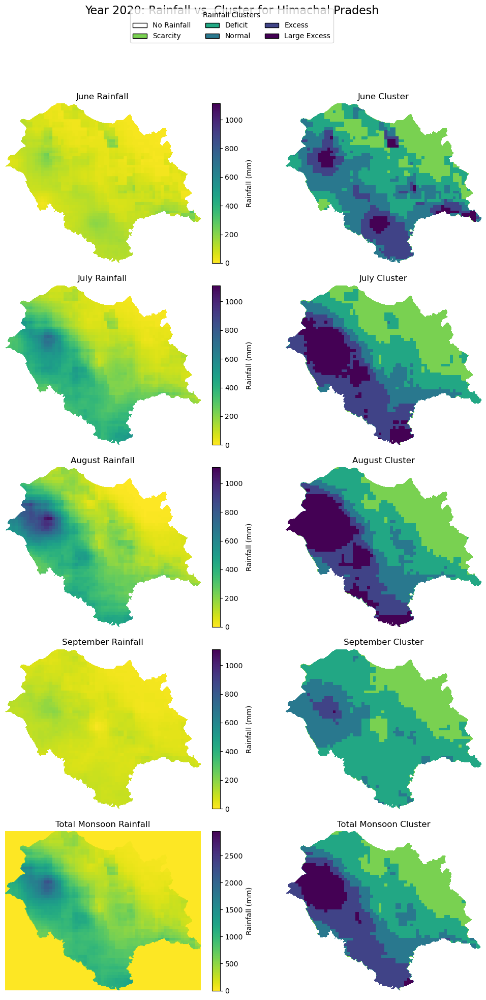

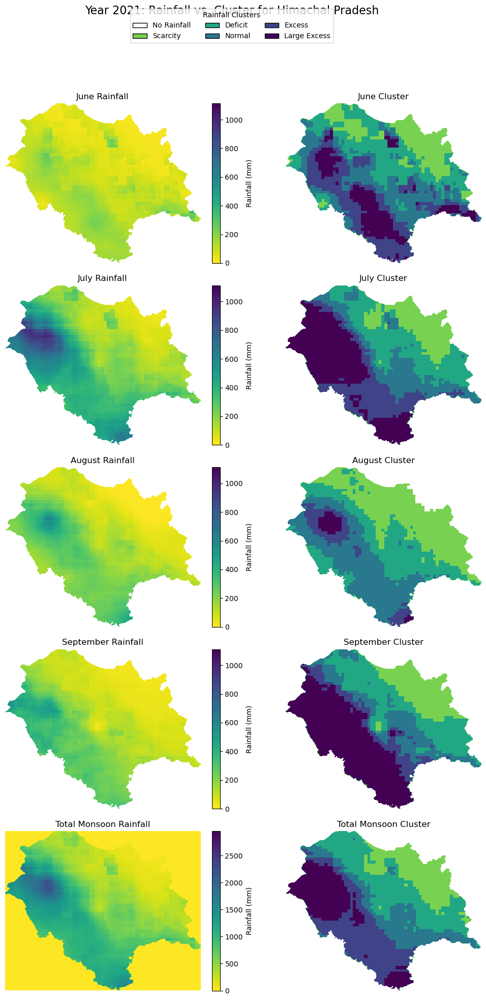

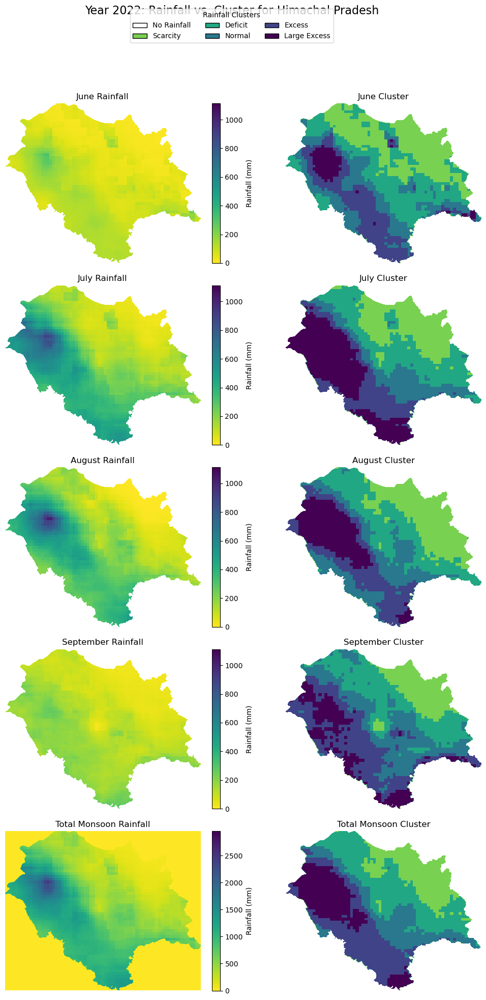

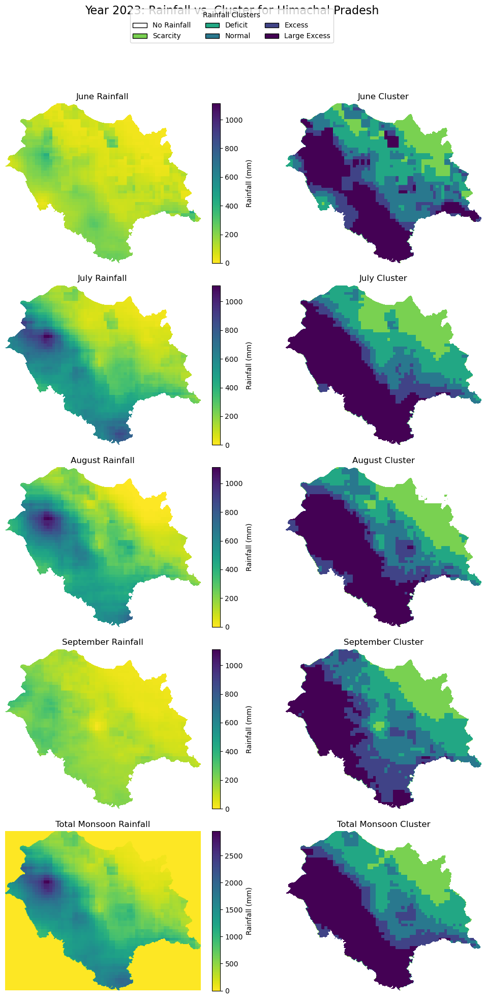

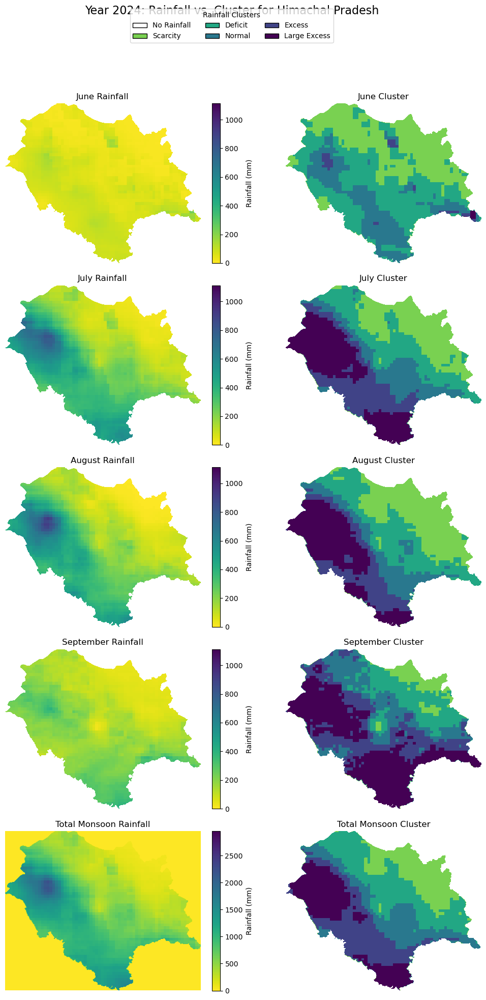

In [13]:
import rasterio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if necessary)
# -----------------------------------------------------------------------------
tiff_path = "Himachal_Y_Precipitation_CHIRPS.tif"
csv_path  = "Himachal_Y_Precipitation_GT.csv"

# -----------------------------------------------------------------------------
# 2) LOAD THE CSV (must contain columns: Year, Month, Latitude, Longitude, Category)
# -----------------------------------------------------------------------------
df = pd.read_csv(csv_path)

# -----------------------------------------------------------------------------
# 3) OPEN THE MULTI‐BAND TIFF (keep it open for indexing later)
# -----------------------------------------------------------------------------
src = rasterio.open(tiff_path)
all_bands = src.read().astype(np.float32)  # shape: (total_bands, H, W)
height, width = src.height, src.width
transform, crs = src.transform, src.crs

# -----------------------------------------------------------------------------
# 4) CONFIGURATION
# -----------------------------------------------------------------------------
start_year      = 2020
bands_per_year  = 5   # (4 monsoon months + 1 extra “slot” per year)
month_to_index  = {
    "June":      0,
    "July":      1,
    "August":    2,
    "September": 3,
    "Total":     4
}
band_names = ['June', 'July', 'August', 'September']

# -----------------------------------------------------------------------------
# 5) CALCULATE vmin/vmax FOR RAINFALL (monthly & total) ACROSS THE ENTIRE TIFF
# -----------------------------------------------------------------------------
# 5a) Stack all monthly bands (4 months × N years) to get vmin_month/vmax_month
monthly_stack_all = []
total_band_count = all_bands.shape[0]
total_years = total_band_count // bands_per_year

for yidx in range(total_years):
    base = yidx * bands_per_year
    monthly_stack_all.append(all_bands[base:base + 4])
monthly_stack_all = np.concatenate(monthly_stack_all, axis=0)  # shape: (4*years, H, W)
vmin_month = np.nanmin(monthly_stack_all)
vmax_month = np.nanmax(monthly_stack_all)

# 5b) Compute “Total Monsoon” min/max by summing each group of 4 bands
total_list = []
for yidx in range(total_years):
    base = yidx * bands_per_year
    this4 = all_bands[base:base + 4]
    total_list.append(np.nansum(this4, axis=0))  # shape: (H, W)
total_stack = np.stack(total_list, axis=0)      # shape: (years, H, W)
vmin_total = np.nanmin(total_stack)
vmax_total = np.nanmax(total_stack)

# -----------------------------------------------------------------------------
# 6) BUILD A CUSTOM “CLUSTER” COLORMAP
# -----------------------------------------------------------------------------
cluster_to_id = {
    'no rainfall':  0,
    'scarcity':     1,
    'deficit':      2,
    'normal':       3,
    'excess':       4,
    'large excess': 5
}
max_cid = len(cluster_to_id) - 1  # = 5

# 6a) Create a list of 6 colors: index0=white, indices1–5 from viridis_r
base_cmap = plt.get_cmap('viridis_r')
colors = []
for cid in range(max_cid + 1):
    if cid == 0:
        colors.append('#ffffff')
    else:
        frac = cid / max_cid
        colors.append(base_cmap(frac))

cluster_cmap = ListedColormap(colors)
legend_handles = [
    Patch(facecolor=colors[cid], edgecolor='black', label=label.title())
    for label, cid in cluster_to_id.items()
]

# -----------------------------------------------------------------------------
# 7) FOR EACH YEAR: PLOT 5 ROWS × 2 COLUMNS → (rainfall vs. cluster)
# -----------------------------------------------------------------------------
years = list(range(start_year, start_year + total_years))
for year_idx, year in enumerate(years):
    base = year_idx * bands_per_year
    # 7a) Extract the four monthly rainfall bands for this year
    monthly_bands = all_bands[base:base + 4]  # shape: (4, H, W)

    # 7b) Compute that year’s “Total Monsoon” rainfall
    total_precip = np.nansum(monthly_bands, axis=0)  # shape: (H, W)

    # 7c) Build a 5×H×W “cluster ID” array: indices 0..3 = months, index 4 = “Total”
    cluster_stack = np.zeros((5, height, width), dtype=np.uint8)

    # Filter the CSV rows for this specific year
    df_year = df[df['Year'] == year]

    # 7d) Fill monthly clusters (indices 0..3) and “Total” clusters (index=4)
    for idx, row in df_year.iterrows():
        m = str(row['Month']).strip()
        if m not in month_to_index:
            continue
        band_idx = month_to_index[m]  # 0..4
        lat = float(row['Latitude'])
        lon = float(row['Longitude'])
        try:
            r, c = src.index(lon, lat)
        except Exception:
            continue
        if not (0 <= r < height and 0 <= c < width):
            continue

        cat_str = str(row['Category']).strip().lower()
        cid = cluster_to_id.get(cat_str, 0)
        cluster_stack[band_idx, r, c] = cid

    # 7e) Build a “rain_cmap” that paints NaN as white
    rain_cmap = plt.get_cmap('viridis_r').copy()
    rain_cmap.set_bad('white')

    # 7f) Create subplots: 5 rows × 2 columns
    fig, axs = plt.subplots(5, 2, figsize=(12, 20))
    fig.suptitle(f"Year {year}: Rainfall vs. Cluster for Himachal Pradesh", fontsize=16)

    # Rows 0..3 → June, July, August, September
    for i in range(4):
        # Left column: monthly rainfall
        im0 = axs[i, 0].imshow(
            monthly_bands[i],
            cmap='viridis_r',
            vmin=vmin_month,
            vmax=vmax_month
        )
        axs[i, 0].set_title(f"{band_names[i]} Rainfall")
        axs[i, 0].axis('off')
        plt.colorbar(im0, ax=axs[i, 0], fraction=0.046, pad=0.04, label='Rainfall (mm)')

        # Right column: monthly cluster
        im1 = axs[i, 1].imshow(
            cluster_stack[i],
            cmap=cluster_cmap,
            vmin=0,
            vmax=max_cid
        )
        axs[i, 1].set_title(f"{band_names[i]} Cluster")
        axs[i, 1].axis('off')

    # Row 4 → Total Monsoon
    # Left: combined rainfall
    im_tot = axs[4, 0].imshow(
        total_precip,
        cmap=rain_cmap,
        vmin=vmin_total,
        vmax=vmax_total
    )
    axs[4, 0].set_title("Total Monsoon Rainfall")
    axs[4, 0].axis('off')
    plt.colorbar(im_tot, ax=axs[4, 0], fraction=0.046, pad=0.04, label='Rainfall (mm)')

    # Right: “Total” cluster
    im_clust_tot = axs[4, 1].imshow(
        cluster_stack[4],
        cmap=cluster_cmap,
        vmin=0,
        vmax=max_cid
    )
    axs[4, 1].set_title("Total Monsoon Cluster")
    axs[4, 1].axis('off')

    # Shared legend at top
    fig.legend(
        handles=legend_handles,
        loc='upper center',
        ncol=3,
        frameon=True,
        title="Rainfall Clusters",
        bbox_to_anchor=(0.5, 0.98)
    )

    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

# -----------------------------------------------------------------------------
# 8) CLOSE THE RASTER
# -----------------------------------------------------------------------------
src.close()


Categorical GeoTIFF saved as: Himachal_Y_Precipitation_GT_geotif.tif


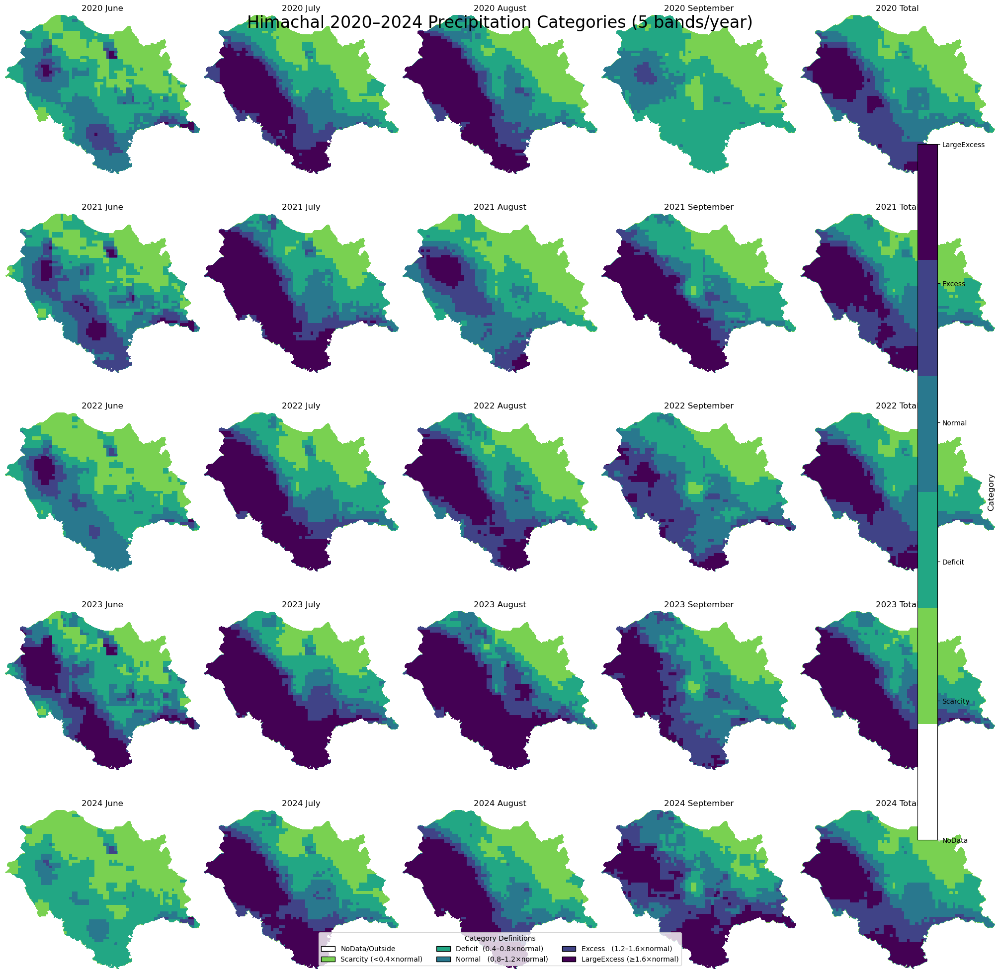

In [29]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) PATH TO YOUR 25‐BAND CHIRPS PRECIPITATION TIFF FOR HIMACHAL
# -----------------------------------------------------------------------------
tiff_path = "Himachal_Y_Precipitation_CHIRPS.tif"
if not os.path.isfile(tiff_path):
    raise FileNotFoundError(f"Cannot find {tiff_path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ ALL 25 BANDS INTO A NumPy ARRAY
# -----------------------------------------------------------------------------
with rasterio.open(tiff_path) as src:
    all_bands = src.read().astype(np.float32)  # shape = (25, H, W)
    profile   = src.profile.copy()
    height, width = src.height, src.width

n_bands = all_bands.shape[0]
if n_bands != 25:
    raise ValueError(f"Expected 25 bands (2020–2024 × 5 months), but found {n_bands}")

# -----------------------------------------------------------------------------
# 3) DEFINE “NORMAL” VALUES FOR HIMACHAL (June, July, August, September, Total)
#
#    Replace the five values below with the correct climatological normals (in mm):
#      Index 0 = June
#      Index 1 = July
#      Index 2 = August
#      Index 3 = September
#      Index 4 = Total Monsoon (June–September)
# -----------------------------------------------------------------------------
normals = np.array([
    120.0,   # June normal (example: replace with actual value)
    225.0,   # July normal
    210.0,   # August normal
    130.0,   # September normal
    685.0    # Total Monsoon normal
], dtype=np.float32)

# -----------------------------------------------------------------------------
# 4) CATEGORY THRESHOLDS (as MULTIPLES of “NORMAL”)
#    - Scarcity    : value < 0.4 × normal
#    - Deficit     : 0.4 ≤ value/normal < 0.8
#    - Normal      : 0.8 ≤ value/normal < 1.2
#    - Excess      : 1.2 ≤ value/normal < 1.6
#    - LargeExcess : value/normal ≥ 1.6
# -----------------------------------------------------------------------------
def categorize_precip(band_data: np.ndarray, normal_value: float) -> np.ndarray:
    """
    Given a 2D array `band_data` (precip in mm) and a scalar `normal_value` (mm),
    return a 2D integer array of the same shape with:
       0 → Scarcity   (value < 0.4×normal)
       1 → Deficit    (0.4×normal ≤ value < 0.8×normal)
       2 → Normal     (0.8×normal ≤ value < 1.2×normal)
       3 → Excess     (1.2×normal ≤ value < 1.6×normal)
       4 → LargeExcess(value ≥ 1.6×normal)
      -1 → NoData (where original band_data is NaN)
    """
    # Initialize category array with -1 (NoData)
    cat = np.full(band_data.shape, -1, dtype=np.int8)

    # Identify valid (non‐NaN) pixels
    valid_mask = ~np.isnan(band_data)
    if not valid_mask.any():
        return cat

    valid_vals = band_data[valid_mask]
    ratio = valid_vals / normal_value

    cat_vals = np.full(valid_vals.shape, -1, dtype=np.int8)
    cat_vals[np.where(ratio < 0.4)] = 0
    cat_vals[np.where((ratio >= 0.4) & (ratio < 0.8))] = 1
    cat_vals[np.where((ratio >= 0.8) & (ratio < 1.2))] = 2
    cat_vals[np.where((ratio >= 1.2) & (ratio < 1.6))] = 3
    cat_vals[np.where(ratio >= 1.6)] = 4

    cat[valid_mask] = cat_vals
    return cat

# -----------------------------------------------------------------------------
# 5) APPLY CATEGORIZATION TO ALL 25 BANDS
# -----------------------------------------------------------------------------
# We'll create a 25‐layer integer stack where each pixel is a code in {0..4} or -1.
category_stack = np.full(all_bands.shape, fill_value=-1, dtype=np.int8)

for band_idx in range(n_bands):
    month_index = band_idx % 5
    normal_val  = normals[month_index]
    band_data   = all_bands[band_idx]  # shape = (H, W)
    category_stack[band_idx] = categorize_precip(band_data, normal_val)

# -----------------------------------------------------------------------------
# 6) EXPORT THE CATEGORY STACK AS A NEW 25‐BAND GeoTIFF
#    Filename: “Himachal_Y_Precipitation_GT_geotif.tif”
# -----------------------------------------------------------------------------
out_profile = profile.copy()
out_profile.update({
    "count": 25,
    "dtype": rasterio.int8,
    "nodata": -1
})

output_path = "Himachal_Y_Precipitation_GT_geotif.tif"
with rasterio.open(output_path, "w", **out_profile) as dst:
    dst.write(category_stack)

print(f"Categorical GeoTIFF saved as: {output_path}")

# -----------------------------------------------------------------------------
# 7) SET UP A DISCRETE COLORMAP FOR THE 5 CATEGORIES + “NoData” AS WHITE
# -----------------------------------------------------------------------------
#   0 → #ffffff  (NoData)
#   1 → #79d151  (Scarcity)
#   2 → #22a784  (Deficit)
#   3 → #29788e  (Normal)
#   4 → #404387  (Excess)
#   5 → #440154  (LargeExcess)  ← these represent 1..5 after shifting
colors = [
    "#ffffff",  # index 0: NoData / outside Himachal
    "#79d151",  # index 1: Scarcity (<0.4×normal)
    "#22a784",  # index 2: Deficit  (0.4–0.8×normal)
    "#29788e",  # index 3: Normal   (0.8–1.2×normal)
    "#404387",  # index 4: Excess   (1.2–1.6×normal)
    "#440154"   # index 5: LargeExcess (≥1.6×normal)
]
cmap = ListedColormap(colors)

legend_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}

legend_handles = []
for code, text in legend_labels.items():
    legend_handles.append(Patch(facecolor=colors[code], edgecolor="black", label=text))

# -----------------------------------------------------------------------------
# 8) VISUALIZE ALL 25 CATEGORY LAYERS IN A 5×5 GRID
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September", "Total"]

fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(20, 20), constrained_layout=True)
fig.suptitle("Himachal 2020–2024 Precipitation Categories (5 bands/year)", fontsize=24, y=0.98)

for band_idx in range(n_bands):
    row = band_idx // 5
    col = band_idx % 5
    ax = axes[row, col]

    cat_layer = category_stack[band_idx]

    # Shift categories:
    #  The array now holds {0..4} or -1.  We want a plotting array {0..5} where:
    #    -1 → 0 (white)
    #     0 → 1 (scarcity)
    #     1 → 2 (deficit)
    #     2 → 3 (normal)
    #     3 → 4 (excess)
    #     4 → 5 (large excess)
    plot_array = np.full(cat_layer.shape, 0, dtype=np.int8)
    valid_mask = (cat_layer != -1)
    plot_array[valid_mask] = cat_layer[valid_mask] + 1

    ax.imshow(plot_array, cmap=cmap, vmin=0, vmax=5)
    ax.set_title(f"{years[row]} {month_names[col]}", fontsize=12)
    ax.axis("off")

# Add a colorbar on the right
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(
    plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=5)),
    cax=cbar_ax,
    ticks=[0, 1, 2, 3, 4, 5]
)
cbar.ax.set_yticklabels([
    "NoData", 
    "Scarcity", 
    "Deficit", 
    "Normal", 
    "Excess", 
    "LargeExcess"
])
cbar.set_label("Category", rotation=90, fontsize=12)

# Add a legend box at the bottom
fig.legend(
    handles=legend_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Category Definitions",
    bbox_to_anchor=(0.5, 0.02)
)

plt.show()


In [ ]:
##Himachal_X_LST

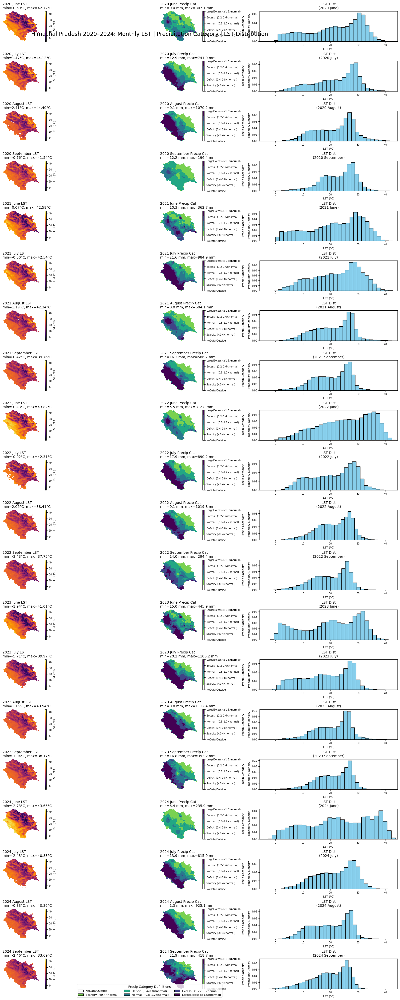

In [37]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust as needed)
#    - LST TIFF:               20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Precipitation RAW TIFF: 25 bands (2020–2024 × 5 bands: June, July, August, September, Total)
#    - Precipitation Category: 25 bands (2020–2024 × 5 category bands)
#
#  For Himachal, we assume:
#    Himachal_X_LST.tif
#    Himachal_Y_Precipitation_CHIRPS.tif
#    Himachal_Y_Precipitation_GT_geotif.tif
# -----------------------------------------------------------------------------
lst_tiff_path        = "Himachal_X_LST.tif"
precip_raw_tiff_path = "Himachal_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path = "Himachal_Y_Precipitation_GT_geotif.tif"
hp_shapefile         = "SateMask/gadm41_IND_1.shp"

for p in (lst_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path, hp_shapefile):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND LST TIFF (2020–2024 × 4 months)
# -----------------------------------------------------------------------------
with rasterio.open(lst_tiff_path) as src_lst:
    lst_bands = src_lst.read().astype(np.float32)  # shape = (20, H, W)
    lst_transform = src_lst.transform
    lst_crs = src_lst.crs
    height, width = src_lst.height, src_lst.width
    bounds = src_lst.bounds

n_lst_bands = lst_bands.shape[0]
if n_lst_bands != 20:
    raise ValueError(f"Expected 20 bands in {lst_tiff_path}, but found {n_lst_bands}")

# -----------------------------------------------------------------------------
# 3) LOAD & REPROJECT HIMACHAL GEOMETRY, BUILD MASK
# -----------------------------------------------------------------------------
gdf = gpd.read_file(hp_shapefile)
gdf_hp = gdf[gdf["NAME_1"].str.lower() == "himachal pradesh"].copy()
if gdf_hp.empty:
    raise ValueError("No feature named 'Himachal Pradesh' found in shapefile.")

if gdf_hp.crs != lst_crs:
    gdf_hp = gdf_hp.to_crs(lst_crs)

hp_geom = [gdf_hp.geometry.union_all()]
hp_mask = geometry_mask(
    hp_geom,
    transform=lst_transform,
    invert=True,
    out_shape=(height, width)
)

# -----------------------------------------------------------------------------
# 4) MASK LST BANDS OUTSIDE HIMACHAL → NaN
# -----------------------------------------------------------------------------
for i in range(n_lst_bands):
    band = lst_bands[i]
    band[~hp_mask] = np.nan
    lst_bands[i] = band

# -----------------------------------------------------------------------------
# 5) READ THE 25‐BAND RAW PRECIPITATION TIFF (monthly sums in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr_raw:
    precip_raw_full = src_pr_raw.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw = precip_raw_full.shape[0]
if n_pr_raw != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}, but found {n_pr_raw}")

# 5a) MASK RAW PRECIP OUTSIDE HIMACHAL → NaN
for i in range(n_pr_raw):
    arr = precip_raw_full[i]
    arr[~hp_mask] = np.nan
    precip_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 6) READ THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pr_cat:
    precip_cat_full = src_pr_cat.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat = precip_cat_full.shape[0]
if n_pr_cat != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}, but found {n_pr_cat}")

# 6a) MASK PRECIP CATEGORY OUTSIDE HIMACHAL → code = -1
for i in range(n_pr_cat):
    arr = precip_cat_full[i]
    arr[~hp_mask] = -1
    precip_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 7) EXTRACT ONLY THE 20 MONTHLY PRECIPITATION BANDS
#    (drop each year’s “Total” at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

precip_raw_bands = precip_raw_full[monthly_indices, :, :]  # shape = (20, H, W)
precip_cat_bands = precip_cat_full[monthly_indices, :, :]  # shape = (20, H, W)

# -----------------------------------------------------------------------------
# 8) DEFINE YEARS & MONTHS ARRAYS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)       # 5
n_months    = len(month_names) # 4
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 9) PREPARE COLORMAPS & STATISTICS
#    a) LST: continuous “inferno” palette
#    b) Precip category: discrete 6‐color palette (0..5)
#    c) Compute per‐month min/max for LST and PR
# -----------------------------------------------------------------------------
# 9a) LST vmin/vmax across all 20 bands (ignore NaNs)
all_lst_vals = lst_bands.flatten()
all_lst_vals = all_lst_vals[~np.isnan(all_lst_vals)]
lst_vmin = float(np.nanmin(all_lst_vals)) if all_lst_vals.size else 0.0
lst_vmax = float(np.nanmax(all_lst_vals)) if all_lst_vals.size else 50.0
lst_cmap  = plt.get_cmap("inferno")

# 9b) Precip category colors
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside (orig code -1)
    "#79d151",  # 1 = Scarcity       (orig code 0)
    "#22a784",  # 2 = Deficit        (orig code 1)
    "#29788e",  # 3 = Normal         (orig code 2)
    "#404387",  # 4 = Excess         (orig code 3)
    "#440154"   # 5 = LargeExcess    (orig code 4)
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 10) BUILD FIGURE: 20 ROWS × 3 COLUMNS
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    figsize=(20, n_total * 2.0),
    constrained_layout=True
)
fig.suptitle(
    "Himachal Pradesh 2020–2024: Monthly LST | Precipitation Category | LST Distribution",
    fontsize=16, y=0.97
)

# If only one row, ensure axes is 2D
if n_total == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 11) LOOP OVER ALL 20 MONTHLY BANDS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total):
    yr_idx  = i // n_months
    mo_idx  = i % n_months
    year    = years[yr_idx]
    month   = month_names[mo_idx]

    # --- a) LST layer & stats (°C) ---
    lst_layer = lst_bands[i]
    valid_lst = lst_layer[~np.isnan(lst_layer)]
    if valid_lst.size > 0:
        lst_min = float(np.nanmin(valid_lst))
        lst_max = float(np.nanmax(valid_lst))
    else:
        lst_min = lst_max = None

    # --- b) Raw precip layer & stats (mm) ---
    raw_pr_layer = precip_raw_bands[i]
    valid_pr = raw_pr_layer[~np.isnan(raw_pr_layer)]
    if valid_pr.size > 0:
        pr_min = float(np.nanmin(valid_pr))
        pr_max = float(np.nanmax(valid_pr))
    else:
        pr_min = pr_max = None

    # --- c) Precip category (shift -1..4 → 0..5) ---
    raw_cat = precip_cat_bands[i]
    cat_plot = np.full(raw_cat.shape, 0, dtype=np.int8)
    mask_valid = (raw_cat != -1)
    cat_plot[mask_valid] = raw_cat[mask_valid] + 1

    # ----- Column 0: LST Map -----
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        lst_layer,
        cmap=lst_cmap,
        vmin=lst_vmin,
        vmax=lst_vmax
    )
    title0 = f"{year} {month} LST"
    if lst_min is not None and lst_max is not None:
        title0 += f"\nmin={lst_min:.2f}°C, max={lst_max:.2f}°C"
    ax0.set_title(title0, fontsize=10, loc="left")
    ax0.axis("off")

    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.046,
        pad=0.04
    )
    cbar0.set_label("LST (°C)", fontsize=8)
    cbar0.ax.tick_params(labelsize=7)

    # ----- Column 1: Precipitation Category Map -----
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cat_plot,
        cmap=cluster_cmap,
        vmin=0,
        vmax=5
    )
    title1 = f"{year} {month} Precip Cat"
    if pr_min is not None and pr_max is not None:
        title1 += f"\nmin={pr_min:.1f} mm, max={pr_max:.1f} mm"
    ax1.set_title(title1, fontsize=10, loc="left")
    ax1.axis("off")

    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.046,
        pad=0.04
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels([
        cluster_labels[0],
        cluster_labels[1],
        cluster_labels[2],
        cluster_labels[3],
        cluster_labels[4],
        cluster_labels[5]
    ], fontsize=7)
    cbar1.ax.tick_params(labelsize=7)
    cbar1.set_label("Precip Category", fontsize=8)

    # ----- Column 2: LST Distribution (Histogram) -----
    ax2 = axes[i, 2]
    if valid_lst.size > 0:
        ax2.hist(
            valid_lst.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="skyblue"
        )
        ax2.set_xlim(lst_vmin, lst_vmax)
    else:
        ax2.text(
            0.5, 0.5, "No Data",
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=8,
            color='gray'
        )
    ax2.set_title(f"LST Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("LST (°C)", fontsize=8)
    ax2.set_ylabel("Probability Density", fontsize=8)
    ax2.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 12) ADD A LEGEND FOR PRECIPITATION CATEGORIES AT BOTTOM CENTER
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, 0.00),
    fontsize=8,
    title_fontsize=9
)

plt.show()



In [ ]:
##Himachal_X_NVDI

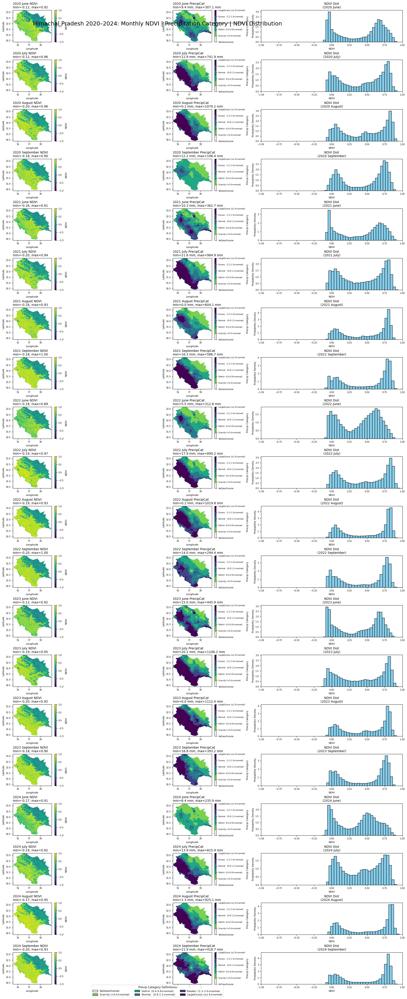

In [68]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
# -----------------------------------------------------------------------------
ndvi_tiff_path       = "Himachal_X_NDVI.tif"
precip_raw_tiff_path = "Himachal_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path = "Himachal_Y_Precipitation_GT_geotif.tif"
india_shapefile      = "SateMask/gadm41_IND_1.shp"  # contains Himachal Pradesh polygon

for path in (ndvi_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path, india_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20-BAND NDVI TIFF (2020–2024 × 4 months)
# -----------------------------------------------------------------------------
with rasterio.open(ndvi_tiff_path) as src_nd:
    ndvi_bands     = src_nd.read().astype(np.float32)  # shape = (20, ndvi_height, ndvi_width)
    ndvi_transform = src_nd.transform
    ndvi_crs       = src_nd.crs
    ndvi_height, ndvi_width = src_nd.height, src_nd.width
    bounds         = src_nd.bounds

n_ndvi_bands = ndvi_bands.shape[0]
if n_ndvi_bands != 20:
    raise ValueError(f"Expected 20 bands in {ndvi_tiff_path}, but found {n_ndvi_bands}")

# 2a) Load India shapefile, extract Himachal Pradesh, reproject to NDVI CRS if needed
gdf = gpd.read_file(india_shapefile)
gdf_himachal = gdf[gdf["NAME_1"].str.lower() == "himachal pradesh"].copy()
if gdf_himachal.empty:
    raise ValueError("No feature named 'Himachal Pradesh' found in shapefile.")

if gdf_himachal.crs != ndvi_crs:
    gdf_himachal = gdf_himachal.to_crs(ndvi_crs)

# 2b) Union of Himachal Pradesh geometry
himachal_geom = [gdf_himachal.geometry.union_all()]

# 2c) Build NDVI mask (True = inside Himachal Pradesh)
himachal_mask_nd = geometry_mask(
    himachal_geom,
    transform=ndvi_transform,
    invert=True,
    out_shape=(ndvi_height, ndvi_width)
)

# 2d) Set NDVI pixels outside Himachal Pradesh → NaN
for i in range(n_ndvi_bands):
    arr = ndvi_bands[i]
    arr[~himachal_mask_nd] = np.nan
    ndvi_bands[i] = arr

# -----------------------------------------------------------------------------
# 3) READ THE 25-BAND RAW PRECIPITATION TIFF (in mm) & BUILD A SEPARATE MASK
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr_raw:
    precip_raw_full = src_pr_raw.read().astype(np.float32)  # shape = (25, pr_height, pr_width)
    pr_transform     = src_pr_raw.transform
    pr_crs           = src_pr_raw.crs
    pr_height, pr_width = src_pr_raw.height, src_pr_raw.width

n_pr_raw_bands = precip_raw_full.shape[0]
if n_pr_raw_bands != 25:
    raise ValueError(
        f"Expected 25 bands in {precip_raw_tiff_path}, but found {n_pr_raw_bands}"
    )

# 3a) Reproject Himachal geometry to precipitation CRS (if needed)
if gdf_himachal.crs != pr_crs:
    gdf_himachal_pr = gdf_himachal.to_crs(pr_crs)
else:
    gdf_himachal_pr = gdf_himachal

himachal_geom_pr = [gdf_himachal_pr.geometry.union_all()]

# Build precipitation-mask (True = inside Himachal Pradesh) on the precipitation grid
himachal_mask_pr = geometry_mask(
    himachal_geom_pr,
    transform=pr_transform,
    invert=True,
    out_shape=(pr_height, pr_width)
)

# 3b) Mask raw precipitation outside Himachal Pradesh → NaN
for i in range(n_pr_raw_bands):
    arr = precip_raw_full[i]          # shape = (pr_height, pr_width)
    arr[~himachal_mask_pr] = np.nan   # now mask and array share the same dims
    precip_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ THE 25-BAND PRECIPITATION CATEGORY TIFF (codes –1..4) & MASK
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pr_cat:
    precip_cat_full = src_pr_cat.read().astype(np.int8)  # shape = (25, cat_height, cat_width)
    cat_transform = src_pr_cat.transform
    cat_crs       = src_pr_cat.crs
    cat_height, cat_width = src_pr_cat.height, src_pr_cat.width

n_pr_cat_bands = precip_cat_full.shape[0]
if n_pr_cat_bands != 25:
    raise ValueError(
        f"Expected 25 bands in {precip_cat_tiff_path}, but found {n_pr_cat_bands}"
    )

# 4a) Reproject Himachal geometry to category-raster CRS (if needed)
if gdf_himachal.crs != cat_crs:
    gdf_himachal_cat = gdf_himachal.to_crs(cat_crs)
else:
    gdf_himachal_cat = gdf_himachal

himachal_geom_cat = [gdf_himachal_cat.geometry.union_all()]

# Build category-mask on the category grid
himachal_mask_cat = geometry_mask(
    himachal_geom_cat,
    transform=cat_transform,
    invert=True,
    out_shape=(cat_height, cat_width)
)

# 4b) Mask precip categories outside Himachal Pradesh → code = –1
for i in range(n_pr_cat_bands):
    arr = precip_cat_full[i]          # shape = (cat_height, cat_width)
    arr[~himachal_mask_cat] = -1
    precip_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT THE 20 MONTHLY PRECIPITATION BANDS
#    (drop each year’s “Total” at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for yr_idx in range(5):
    base = yr_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

precip_raw_bands = precip_raw_full[monthly_indices, :, :]  # shape = (20, pr_height, pr_width)
precip_cat_bands = precip_cat_full[monthly_indices, :, :]  # shape = (20, cat_height, cat_width)

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)       # 5
n_months    = len(month_names) # 4
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & STATISTICS FOR PLOTTING
# -----------------------------------------------------------------------------
# 7a) NDVI colormap: continuous “viridis” from –1 to 1
ndvi_cmap = plt.get_cmap("viridis")
ndvi_vmin, ndvi_vmax = -1.0, 1.0

# 7b) Precipitation category palette (0..5 after shifting)
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside (orig code -1)
    "#79d151",  # 1 = Scarcity      (orig code  0)
    "#22a784",  # 2 = Deficit       (orig code  1)
    "#29788e",  # 3 = Normal        (orig code  2)
    "#404387",  # 4 = Excess        (orig code  3)
    "#440154"   # 5 = LargeExcess   (orig code  4)
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 8) BUILD FIGURE: 20 ROWS × 3 COLUMNS
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    figsize=(22, n_total * 2.2),  # Each row ~2.2" tall → total ~44"
    constrained_layout=True
)
fig.suptitle(
    "Himachal Pradesh 2020–2024: Monthly NDVI | Precipitation Category | NDVI Distribution",
    fontsize=18, y=0.98
)

# If single row, force axes to 2D
if n_total == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP OVER ALL 20 MONTHS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total):
    yr_idx  = i // n_months
    mo_idx  = i % n_months
    year    = years[yr_idx]
    month   = month_names[mo_idx]

    # --- NDVI layer & min/max (–1..1) ---
    ndvi_layer = ndvi_bands[i]
    valid_ndvi = ndvi_layer[~np.isnan(ndvi_layer)]
    if valid_ndvi.size > 0:
        ndvi_min = float(np.nanmin(valid_ndvi))
        ndvi_max = float(np.nanmax(valid_ndvi))
    else:
        ndvi_min = ndvi_max = None

    # --- Raw precipitation layer & min/max (in mm) ---
    raw_pr_layer = precip_raw_bands[i]
    valid_pr = raw_pr_layer[~np.isnan(raw_pr_layer)]
    if valid_pr.size > 0:
        pr_min = float(np.nanmin(valid_pr))
        pr_max = float(np.nanmax(valid_pr))
    else:
        pr_min = pr_max = None

    # --- Precip category (orig –1..4 → plot as 0..5) ---
    raw_clust = precip_cat_bands[i]  # values in {–1,0,1,2,3,4}
    cluster_plot = np.full(raw_clust.shape, 0, dtype=np.int8)
    mask_valid = (raw_clust != -1)
    cluster_plot[mask_valid] = raw_clust[mask_valid] + 1  # now {1..5}

    # ----- Column 0: NDVI Map -----
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        ndvi_layer,
        cmap=ndvi_cmap,
        vmin=ndvi_vmin,
        vmax=ndvi_vmax,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title0 = f"{year} {month} NDVI"
    if ndvi_min is not None and ndvi_max is not None:
        title0 += f"\nmin={ndvi_min:.2f}, max={ndvi_max:.2f}"
    ax0.set_title(title0, fontsize=10, loc="left")
    ax0.set_xlabel("Longitude", fontsize=8)
    ax0.set_ylabel("Latitude", fontsize=8)
    ax0.tick_params(labelsize=7)

    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.045,
        pad=0.02
    )
    cbar0.set_label("NDVI", fontsize=8)
    cbar0.ax.tick_params(labelsize=7)

    # ----- Column 1: Precipitation Category Map -----
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cluster_plot,
        cmap=cluster_cmap,
        vmin=0,
        vmax=5,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title1 = f"{year} {month} PrecipCat"
    if pr_min is not None and pr_max is not None:
        title1 += f"\nmin={pr_min:.1f} mm, max={pr_max:.1f} mm"
    ax1.set_title(title1, fontsize=10, loc="left")
    ax1.set_xlabel("Longitude", fontsize=8)
    ax1.set_ylabel("Latitude", fontsize=8)
    ax1.tick_params(labelsize=7)

    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.045,
        pad=0.02
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels([
        cluster_labels[0],
        cluster_labels[1],
        cluster_labels[2],
        cluster_labels[3],
        cluster_labels[4],
        cluster_labels[5]
    ], fontsize=6)
    cbar1.ax.tick_params(labelsize=6)
    cbar1.set_label("Precip Category", fontsize=8)

    # ----- Column 2: NDVI Distribution (Histogram) -----
    ax2 = axes[i, 2]
    if valid_ndvi.size > 0:
        ax2.hist(
            valid_ndvi.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="skyblue"
        )
        ax2.set_xlim(ndvi_vmin, ndvi_vmax)
    else:
        ax2.text(
            0.5, 0.5, "No Data",
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=8,
            color='gray'
        )
    ax2.set_title(f"NDVI Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("NDVI", fontsize=8)
    ax2.set_ylabel("Probability Density", fontsize=8)
    ax2.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 10) Legend for Precipitation Categories at bottom center
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, -0.005),
    fontsize=8,
    title_fontsize=9
)

plt.show()


In [ ]:
##Himachal_X_Relative_Humidity

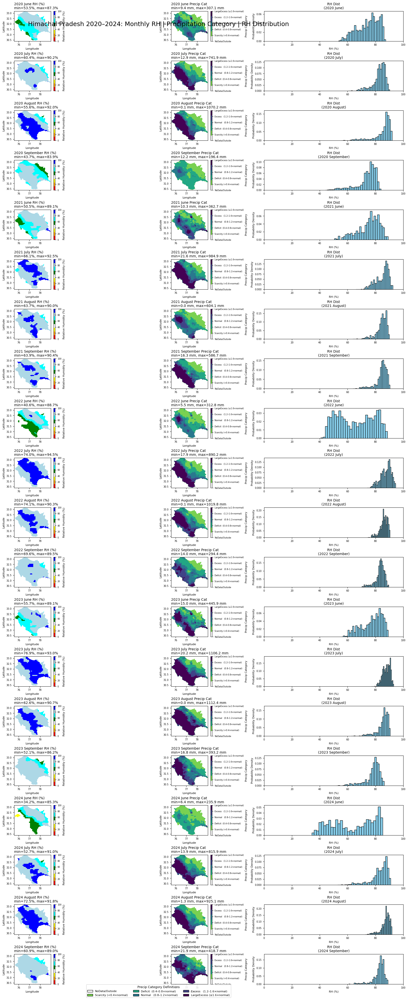

In [50]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - Relative Humidity TIFF:       20 bands (June–Sept 2020–2024)
#    - Raw Precipitation TIFF:       25 bands (2020–2024 × 5: Jun, Jul, Aug, Sep, Total)
#    - Precipitation Category TIFF:  25 bands (2020–2024 × 5 category bands)
#    - Himachal mask shapefile:      "SateMask/gadm41_IND_1.shp"  (contains all Indian states)
# -----------------------------------------------------------------------------
rh_tiff_path        = "Himachal_X_Relative_Humidity.tif"
precip_raw_tiff     = "Himachal_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff     = "Himachal_Y_Precipitation_GT_geotif.tif"
india_shapefile     = "SateMask/gadm41_IND_1.shp"

for path in (rh_tiff_path, precip_raw_tiff, precip_cat_tiff, india_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20‐BAND RELATIVE HUMIDITY TIFF
# -----------------------------------------------------------------------------
with rasterio.open(rh_tiff_path) as src_rh:
    rh_bands      = src_rh.read().astype(np.float32)  # shape = (20, H, W)
    rh_transform  = src_rh.transform
    rh_crs        = src_rh.crs
    height, width = src_rh.height, src_rh.width
    rh_bounds     = src_rh.bounds

n_rh_bands = rh_bands.shape[0]
if n_rh_bands != 20:
    raise ValueError(f"Expected 20 bands in {rh_tiff_path}, but found {n_rh_bands}")

# 2a) Load Himachal Pradesh from the shapefile and reproject to match RH CRS
gdf = gpd.read_file(india_shapefile)
gdf_himachal = gdf[gdf["NAME_1"].str.lower() == "himachal pradesh"].copy()
if gdf_himachal.empty:
    raise ValueError("No feature named 'Himachal Pradesh' found in shapefile.")

if gdf_himachal.crs != rh_crs:
    gdf_himachal = gdf_himachal.to_crs(rh_crs)

# 2b) Build a single unioned geometry for Himachal Pradesh
#     Using .union_all() to avoid the unary_union deprecation warning
himachal_geom = [gdf_himachal.geometry.union_all()]

# 2c) Create a boolean mask where True = inside Himachal
himachal_mask = geometry_mask(
    himachal_geom,
    transform=rh_transform,
    invert=True,
    out_shape=(height, width)
)

# 2d) Set RH pixels outside Himachal → NaN
for i in range(n_rh_bands):
    band = rh_bands[i]
    band[~himachal_mask] = np.nan
    rh_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ & MASK THE 25‐BAND RAW PRECIPITATION TIFF (in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff) as src_pr_raw:
    pr_raw_full = src_pr_raw.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw = pr_raw_full.shape[0]
if n_pr_raw != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff}, but found {n_pr_raw}")

# 3a) Mask raw precipitation outside Himachal → NaN
for i in range(n_pr_raw):
    arr = pr_raw_full[i]
    arr[~himachal_mask] = np.nan
    pr_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ & MASK THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff) as src_pr_cat:
    pr_cat_full = src_pr_cat.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat = pr_cat_full.shape[0]
if n_pr_cat != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff}, but found {n_pr_cat}")

# 4a) Mask precipitation categories outside Himachal → code = -1
for i in range(n_pr_cat):
    arr = pr_cat_full[i]
    arr[~himachal_mask] = -1
    pr_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT THE 20 MONTHLY PRECIP BANDS
#    (drop each year's “Total” at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for y in range(5):
    base = y * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

#  Now shapes = (20, H, W)
pr_raw_bands = pr_raw_full[monthly_indices, :, :]
pr_cat_bands = pr_cat_full[monthly_indices, :, :]

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)
n_months    = len(month_names)
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & GLOBAL STATISTICS
# -----------------------------------------------------------------------------
# 7a) Relative Humidity colormap (8-step reversed from red→blue)
rh_palette = [
    "red",        # very high RH
    "orange",
    "yellow",
    "white",
    "green",
    "cyan",
    "lightblue",
    "blue"        # very low RH
]
rh_cmap = ListedColormap(rh_palette)
rh_vmin, rh_vmax = 0, 100  # RH in percent

# 7b) Precipitation category palette (0..5 after shifting)
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside (orig code = -1)
    "#79d151",  # 1 = Scarcity  (<0.4×normal)
    "#22a784",  # 2 = Deficit   (0.4–0.8×normal)
    "#29788e",  # 3 = Normal    (0.8–1.2×normal)
    "#404387",  # 4 = Excess    (1.2–1.6×normal)
    "#440154"   # 5 = LargeExcess (≥1.6×normal)
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# 7c) Global min/max of raw precipitation (mm), ignoring NaNs
all_pr_vals = pr_raw_bands.flatten()
all_pr_vals = all_pr_vals[~np.isnan(all_pr_vals)]
if all_pr_vals.size > 0:
    pr_vmin = float(np.nanmin(all_pr_vals))
    pr_vmax = float(np.nanmax(all_pr_vals))
else:
    pr_vmin = pr_vmax = 0.0

# -----------------------------------------------------------------------------
# 8) CREATE THE FIGURE: 20 ROWS × 3 COLUMNS (one row per month)
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    figsize=(20, n_total * 2.0),
    constrained_layout=True
)
fig.suptitle(
    "Himachal Pradesh 2020–2024: Monthly RH | Precipitation Category | RH Distribution",
    fontsize=18,
    y=0.98
)

# If there was only one row, force 2D axes
if n_total == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP OVER ALL 20 MONTHS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total):
    yr_idx   = i // n_months
    mo_idx   = i % n_months
    year     = years[yr_idx]
    month    = month_names[mo_idx]

    # --- (a) Extract RH layer and compute min/max over Himachal ---
    rh_layer = rh_bands[i]  # (H, W), values ~[0..100]
    valid_rh = rh_layer[~np.isnan(rh_layer)]
    if valid_rh.size > 0:
        rh_min = float(np.nanmin(valid_rh))
        rh_max = float(np.nanmax(valid_rh))
    else:
        rh_min = rh_max = None

    # --- (b) Extract raw precipitation layer and compute min/max ---
    pr_layer = pr_raw_bands[i]  # (H, W), monthly sum in mm
    valid_pr = pr_layer[~np.isnan(pr_layer)]
    if valid_pr.size > 0:
        pr_min = float(np.nanmin(valid_pr))
        pr_max = float(np.nanmax(valid_pr))
    else:
        pr_min = pr_max = None

    # --- (c) Load precip category band and shift codes from −1..4 → 0..5 ---
    cat_layer = pr_cat_bands[i]  # values in {−1, 0, 1, 2, 3, 4}
    cat_plot  = np.full(cat_layer.shape, 0, dtype=np.int8)
    valid_mask = (cat_layer != -1)
    cat_plot[valid_mask] = cat_layer[valid_mask] + 1  # now in {1..5}

    # ----- Column 0: RH Map -----
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        rh_layer,
        cmap=rh_cmap,
        vmin=rh_vmin,
        vmax=rh_vmax,
        extent=[rh_bounds.left, rh_bounds.right, rh_bounds.bottom, rh_bounds.top],
        origin="upper"
    )
    title0 = f"{year} {month} RH (%)"
    if (rh_min is not None) and (rh_max is not None):
        title0 += f"\nmin={rh_min:.1f}%, max={rh_max:.1f}%"
    ax0.set_title(title0, fontsize=10, loc="left")
    ax0.set_xlabel("Longitude", fontsize=8)
    ax0.set_ylabel("Latitude", fontsize=8)
    ax0.tick_params(labelsize=7)

    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.045,
        pad=0.02
    )
    cbar0.set_label("Relative Humidity (%)", fontsize=8)
    cbar0.ax.tick_params(labelsize=6)

    # ----- Column 1: Precipitation Category Map -----
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cat_plot,
        cmap=cluster_cmap,
        vmin=0,
        vmax=5,
        extent=[rh_bounds.left, rh_bounds.right, rh_bounds.bottom, rh_bounds.top],
        origin="upper"
    )
    title1 = f"{year} {month} Precip Cat"
    if (pr_min is not None) and (pr_max is not None):
        title1 += f"\nmin={pr_min:.1f} mm, max={pr_max:.1f} mm"
    ax1.set_title(title1, fontsize=10, loc="left")
    ax1.set_xlabel("Longitude", fontsize=8)
    ax1.set_ylabel("Latitude", fontsize=8)
    ax1.tick_params(labelsize=7)

    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.045,
        pad=0.02
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels([
        cluster_labels[0],
        cluster_labels[1],
        cluster_labels[2],
        cluster_labels[3],
        cluster_labels[4],
        cluster_labels[5]
    ], fontsize=6)
    cbar1.ax.tick_params(labelsize=6)
    cbar1.set_label("Precip Category", fontsize=8)

    # ----- Column 2: RH Distribution (Histogram) -----
    ax2 = axes[i, 2]
    if valid_rh.size > 0:
        ax2.hist(
            valid_rh.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="skyblue"
        )
        ax2.set_xlim(rh_vmin, rh_vmax)
    else:
        ax2.text(
            0.5, 0.5, "No Data",
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=8,
            color='gray'
        )
    ax2.set_title(f"RH Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("RH (%)", fontsize=8)
    ax2.set_ylabel("Probability Density", fontsize=8)
    ax2.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 10) Legend for Precipitation Categories at bottom center
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, -0.005),
    fontsize=8,
    title_fontsize=9
)

plt.show()


In [ ]:
##Himachal_X_Wind_Speed

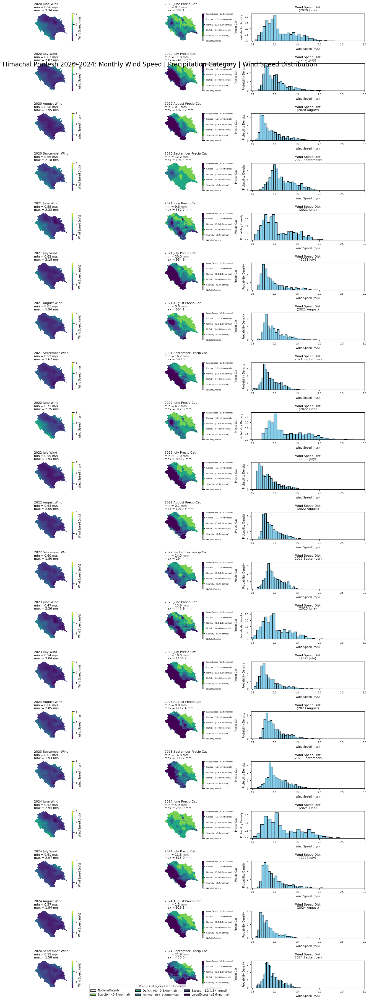

In [61]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust as needed)
#    - Wind Speed TIFF:       20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Precipitation RAW TIFF: 25 bands (2020–2024 × 5 bands: June, July, August, September, Total)
#    - Precipitation Category TIFF: 25 bands (2020–2024 × 5 bands of category codes)
#
#  For Himachal Pradesh, we assume:
#    Himachal_X_Wind_Speed.tif
#    Himachal_Y_Precipitation_CHIRPS.tif
#    Himachal_Y_Precipitation_GT_geotif.tif
# -----------------------------------------------------------------------------
wind_tiff_path        = "Himachal_X_Wind_Speed.tif"
precip_raw_tiff_path  = "Himachal_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path  = "Himachal_Y_Precipitation_GT_geotif.tif"

for p in (wind_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND WIND SPEED TIFF (2020–2024 × 4 months)
# -----------------------------------------------------------------------------
with rasterio.open(wind_tiff_path) as src_wind:
    wind_bands   = src_wind.read().astype(np.float32)  # shape = (20, H, W)
    height, width = src_wind.height, src_wind.width

n_wind_bands = wind_bands.shape[0]
if n_wind_bands != 20:
    raise ValueError(f"Expected 20 bands in {wind_tiff_path}, but found {n_wind_bands}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND RAW PRECIPITATION TIFF (monthly sums in mm, 5 bands/year)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr_raw:
    precip_raw_full = src_pr_raw.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw_bands = precip_raw_full.shape[0]
if n_pr_raw_bands != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}, but found {n_pr_raw_bands}")

# -----------------------------------------------------------------------------
# 4) READ THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pr_cat:
    precip_cat_full = src_pr_cat.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat_bands = precip_cat_full.shape[0]
if n_pr_cat_bands != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}, but found {n_pr_cat_bands}")

# -----------------------------------------------------------------------------
# 5) EXTRACT ONLY THE 20 MONTHLY PRECIP BANDS (ignore each year's “Total” at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

# Now shapes: (20, H, W)
precip_raw_bands = precip_raw_full[monthly_indices, :, :]
precip_cat_bands = precip_cat_full[monthly_indices, :, :]

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS AND MONTHS
#    Years:  [2020, 2021, 2022, 2023, 2024]
#    Months: ["June", "July", "August", "September"]
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)       # 5
n_months    = len(month_names) # 4

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS
#    a) Wind speed: continuous “viridis” palette
#    b) Precip categories: discrete 6‐color palette (0..5)
# -----------------------------------------------------------------------------
# 7a) Determine overall wind speed range (ignore NaN)
valid_wind = wind_bands.flatten()
valid_wind = valid_wind[~np.isnan(valid_wind)]
wind_vmin = max(0.0, float(np.nanmin(valid_wind)))
wind_vmax = float(np.ceil(np.nanmax(valid_wind)))
wind_cmap  = plt.get_cmap("viridis")

# 7b) Precip category colormap
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside
    "#79d151",  # 1 = Scarcity (<0.4×normal)
    "#22a784",  # 2 = Deficit  (0.4–0.8×normal)
    "#29788e",  # 3 = Normal   (0.8–1.2×normal)
    "#404387",  # 4 = Excess   (1.2–1.6×normal)
    "#440154"   # 5 = LargeExcess (≥1.6×normal)
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 8) BUILD FIGURE: 20 ROWS × 3 COLUMNS
#    Each row corresponds to one month‐year (chronological):
#      Row  0 → 2020_June, …, Row 19 → 2024_September
#    Columns: [0] Wind Speed Map | [1] Precip Cat Map | [2] Wind Speed Distribution
# -----------------------------------------------------------------------------
n_total_months = n_years * n_months  # = 20
fig, axes = plt.subplots(
    nrows=n_total_months,
    ncols=3,
    figsize=(15, n_total_months * 1.8),
    constrained_layout=True
)
fig.suptitle(
    "Himachal Pradesh 2020–2024: Monthly Wind Speed | Precipitation Category | Wind Speed Distribution\n",
    fontsize=16, y=0.94
)

# If only one row, force 2D axes
if n_total_months == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP OVER ALL 20 MONTHLY BANDS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total_months):
    year_idx  = i // n_months
    month_idx = i % n_months
    year      = years[year_idx]
    month     = month_names[month_idx]

    # --- a) Wind Speed Layer & Stats ---
    wind_layer = wind_bands[i]  # (H, W)
    valid_ws = wind_layer[~np.isnan(wind_layer)]
    if valid_ws.size > 0:
        ws_min = float(np.nanmin(valid_ws))
        ws_max = float(np.nanmax(valid_ws))
    else:
        ws_min = np.nan
        ws_max = np.nan

    # --- b) Precip Raw Layer & Stats (in mm) ---
    raw_pr_layer = precip_raw_bands[i]  # (H, W) in mm
    valid_pr = raw_pr_layer[~np.isnan(raw_pr_layer)]
    if valid_pr.size > 0:
        pr_min = float(np.nanmin(valid_pr))
        pr_max = float(np.nanmax(valid_pr))
    else:
        pr_min = np.nan
        pr_max = np.nan

    # --- c) Precip Category Layer (codes -1..4 → plotted as 0..5) ---
    raw_clust = precip_cat_bands[i]    # values in {-1,0,1,2,3,4}
    cluster_plot = np.full(raw_clust.shape, 0, dtype=np.int8)
    mask_valid = (raw_clust != -1)
    cluster_plot[mask_valid] = raw_clust[mask_valid] + 1  # now in {1..5}

    # -------- Column 0: Wind Speed Map --------
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        wind_layer,
        cmap=wind_cmap,
        vmin=wind_vmin,
        vmax=wind_vmax
    )
    ax0.set_title(
        f"{year} {month} Wind\nmin = {ws_min:.2f} m/s\nmax = {ws_max:.2f} m/s",
        fontsize=8,
        loc="left"
    )
    ax0.axis("off")

    # Wind colorbar
    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.046,
        pad=0.04
    )
    cbar0.set_label("Wind Speed (m/s)", fontsize=7)
    cbar0.ax.tick_params(labelsize=6)

    # -------- Column 1: Precipitation Category Map --------
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cluster_plot,
        cmap=cluster_cmap,
        vmin=0,
        vmax=5
    )
    ax1.set_title(
        f"{year} {month} Precip Cat\nmin = {pr_min:.1f} mm\nmax = {pr_max:.1f} mm",
        fontsize=8,
        loc="left"
    )
    ax1.axis("off")

    # Precip category colorbar
    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.046,
        pad=0.04
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels([
        cluster_labels[0],
        cluster_labels[1],
        cluster_labels[2],
        cluster_labels[3],
        cluster_labels[4],
        cluster_labels[5]
    ])
    cbar1.ax.tick_params(labelsize=5)
    cbar1.set_label("Precip Cat", fontsize=7)

    # -------- Column 2: Wind Speed Distribution --------
    ax2 = axes[i, 2]
    ax2.hist(
        valid_ws.flatten(),
        bins=30,
        density=True,
        edgecolor="black",
        color="skyblue"
    )
    ax2.set_xlim(wind_vmin, wind_vmax)
    ax2.set_title(
        f"Wind Speed Dist\n({year} {month})",
        fontsize=8
    )
    ax2.set_xlabel("Wind Speed (m/s)", fontsize=7)
    ax2.set_ylabel("Probability Density", fontsize=7)
    ax2.tick_params(axis="both", labelsize=6)

# -----------------------------------------------------------------------------
# 10) LEGEND FOR PRECIPITATION CATEGORIES AT BOTTOM CENTER ---------------------
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, 0.00),
    fontsize=7,
    title_fontsize=8
)

plt.show()


In [ ]:
##Himachal_X_LULC

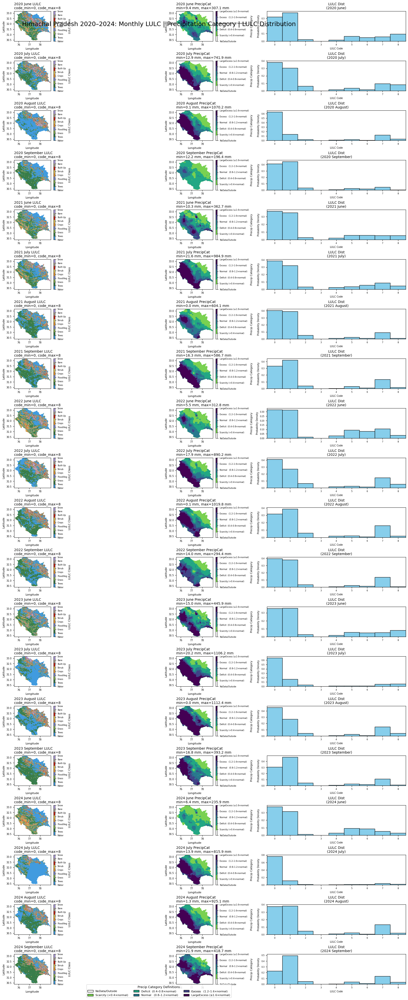

In [47]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - LULC TIFF:               20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Precipitation RAW TIFF:  25 bands (2020–2024 × 5 bands: June, July, August, September, Total)
#    - Precipitation Category:  25 bands (2020–2024 × 5 category bands)
#    - India shapefile:         "SateMask/gadm41_IND_1.shp" (contains Himachal Pradesh)
#
#  For Himachal Pradesh, we assume the files are named:
#    Himachal_X_LULC.tif
#    Himachal_Y_Precipitation_CHIRPS.tif
#    Himachal_Y_Precipitation_GT_geotif.tif
# -----------------------------------------------------------------------------
lulc_tiff_path        = "Himachal_X_LULC.tif"
precip_raw_tiff_path  = "Himachal_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path  = "Himachal_Y_Precipitation_GT_geotif.tif"
india_shapefile       = "SateMask/gadm41_IND_1.shp"

for p in (lulc_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path, india_shapefile):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20‐BAND LULC TIFF (2020–2024 × 4 months)
# -----------------------------------------------------------------------------
with rasterio.open(lulc_tiff_path) as src_lulc:
    lulc_bands     = src_lulc.read().astype(np.float32)  # shape = (20, H, W)
    lulc_transform = src_lulc.transform
    lulc_crs       = src_lulc.crs
    height, width  = src_lulc.height, src_lulc.width
    bounds         = src_lulc.bounds

n_lulc_bands = lulc_bands.shape[0]
if n_lulc_bands != 20:
    raise ValueError(f"Expected 20 bands in {lulc_tiff_path}, but found {n_lulc_bands}")

# 2a) Load India shapefile and extract Himachal Pradesh, reproject to LULC CRS
gdf = gpd.read_file(india_shapefile)
gdf_himachal = gdf[gdf["NAME_1"].str.lower() == "himachal pradesh"].copy()
if gdf_himachal.empty:
    raise ValueError("No feature named 'Himachal Pradesh' found in shapefile.")

if gdf_himachal.crs != lulc_crs:
    gdf_himachal = gdf_himachal.to_crs(lulc_crs)

# 2b) Use union_all() to get a single geometry
himachal_geom = [gdf_himachal.geometry.union_all()]

# 2c) Build a boolean mask (True = inside Himachal)
himachal_mask = geometry_mask(
    himachal_geom,
    transform = lulc_transform,
    invert    = True,            # keep pixels INSIDE Himachal
    out_shape = (height, width)
)

# 2d) Set pixels outside Himachal → NaN
for i in range(n_lulc_bands):
    band = lulc_bands[i]
    band[~himachal_mask] = np.nan
    lulc_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND RAW PRECIPITATION TIFF (in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr_raw:
    precip_raw_full = src_pr_raw.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw_bands = precip_raw_full.shape[0]
if n_pr_raw_bands != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}, but found {n_pr_raw_bands}")

# 3a) Mask raw precipitation outside Himachal → NaN
for i in range(n_pr_raw_bands):
    arr = precip_raw_full[i]
    arr[~himachal_mask] = np.nan
    precip_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes –1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pr_cat:
    precip_cat_full = src_pr_cat.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat_bands = precip_cat_full.shape[0]
if n_pr_cat_bands != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}, but found {n_pr_cat_bands}")

# 4a) Mask categories outside Himachal → code = -1
for i in range(n_pr_cat_bands):
    arr = precip_cat_full[i]
    arr[~himachal_mask] = -1
    precip_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT THE 20 MONTHLY PRECIPITATION BANDS
#    (drop each year’s “Total” at indices 4,9,14,19,24)
# -----------------------------------------------------------------------------
monthly_indices = []
for yr_idx in range(5):
    base = yr_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

precip_raw_bands = precip_raw_full[monthly_indices, :, :]  # shape = (20, H, W)
precip_cat_bands = precip_cat_full[monthly_indices, :, :]  # shape = (20, H, W)

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)       # 5
n_months    = len(month_names) # 4
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & GLOBAL STATISTICS
# -----------------------------------------------------------------------------
# 7a) Dynamic World palette for LULC (9 classes: 0..8)
dw_palette = [
    "#419bdf",  # 0 = Water
    "#397d49",  # 1 = Trees
    "#88b053",  # 2 = Grass
    "#7a87c6",  # 3 = Flooded Vegetation
    "#e49635",  # 4 = Crops
    "#dfc35a",  # 5 = Shrub & Scrub
    "#c4281b",  # 6 = Built‐Up
    "#a59b8f",  # 7 = Bare Ground
    "#b39fe1"   # 8 = Snow & Ice
]
lulc_cmap = ListedColormap(dw_palette)
lulc_vmin, lulc_vmax = 0, 8

# 7b) Precipitation category palette (shifted codes 0..5)
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside  (orig code -1)
    "#79d151",  # 1 = Scarcity        (orig code 0)
    "#22a784",  # 2 = Deficit         (orig code 1)
    "#29788e",  # 3 = Normal          (orig code 2)
    "#404387",  # 4 = Excess          (orig code 3)
    "#440154"   # 5 = LargeExcess     (orig code 4)
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# 7c) Global min/max of raw precipitation (in mm), ignoring NaNs
all_pr_vals = precip_raw_bands.flatten()
all_pr_vals = all_pr_vals[~np.isnan(all_pr_vals)]
if all_pr_vals.size > 0:
    pr_vmin = float(np.nanmin(all_pr_vals))
    pr_vmax = float(np.nanmax(all_pr_vals))
else:
    pr_vmin = pr_vmax = 0.0

# -----------------------------------------------------------------------------
# 8) CREATE THE FIGURE (20 rows × 3 columns)
#    Columns: [0] LULC map | [1] Precip Category map | [2] LULC distribution (histogram)
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    figsize=(20, n_total * 2.0),
    constrained_layout=True
)
fig.suptitle(
    "Himachal Pradesh 2020–2024: Monthly LULC | Precipitation Category | LULC Distribution",
    fontsize=18, y=0.98
)

# If only one row, force axes to 2D
if n_total == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP THROUGH EACH MONTH (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total):
    year_idx  = i // n_months
    month_idx = i % n_months
    year      = years[year_idx]
    month     = month_names[month_idx]

    # (a) Extract LULC band & compute min/max codes
    lulc_layer = lulc_bands[i]
    valid_lulc = lulc_layer[~np.isnan(lulc_layer)]
    if valid_lulc.size > 0:
        lc_min = int(np.nanmin(valid_lulc))
        lc_max = int(np.nanmax(valid_lulc))
    else:
        lc_min = lc_max = None

    # (b) Extract raw precipitation & compute min/max (in mm)
    raw_pr_layer = precip_raw_bands[i]
    valid_pr = raw_pr_layer[~np.isnan(raw_pr_layer)]
    if valid_pr.size > 0:
        pr_min = float(np.nanmin(valid_pr))
        pr_max = float(np.nanmax(valid_pr))
    else:
        pr_min = pr_max = None

    # (c) Shift precipitation category codes (–1..4 → 0..5)
    raw_clust = precip_cat_bands[i]    # values in {–1,0,1,2,3,4}
    cluster_plot = np.full(raw_clust.shape, 0, dtype=np.int8)
    mask_valid = (raw_clust != -1)
    cluster_plot[mask_valid] = raw_clust[mask_valid] + 1  # now in {1..5}

    # ----- Column 0: LULC Map -----
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        lulc_layer,
        cmap=lulc_cmap,
        vmin=lulc_vmin,
        vmax=lulc_vmax,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title0 = f"{year} {month} LULC"
    if lc_min is not None and lc_max is not None:
        title0 += f"\ncode_min={lc_min}, code_max={lc_max}"
    ax0.set_title(title0, fontsize=10, loc="left")
    ax0.set_xlabel("Longitude", fontsize=8)
    ax0.set_ylabel("Latitude", fontsize=8)
    ax0.tick_params(labelsize=7)

    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.045,
        pad=0.02
    )
    cbar0.set_ticks(np.arange(0, 9))
    cbar0.ax.set_yticklabels(
        ["Water", "Trees", "Grass", "FloodVeg", "Crops",
         "Shrub", "Built‐Up", "Bare", "Snow"],
        fontsize=6
    )
    cbar0.ax.tick_params(labelsize=6)
    cbar0.set_label("LULC Class", fontsize=8)

    # ----- Column 1: Precipitation Category Map -----
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cluster_plot,
        cmap=cluster_cmap,
        vmin=0,
        vmax=5,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title1 = f"{year} {month} PrecipCat"
    if pr_min is not None and pr_max is not None:
        title1 += f"\nmin={pr_min:.1f} mm, max={pr_max:.1f} mm"
    ax1.set_title(title1, fontsize=10, loc="left")
    ax1.set_xlabel("Longitude", fontsize=8)
    ax1.set_ylabel("Latitude", fontsize=8)
    ax1.tick_params(labelsize=7)

    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.045,
        pad=0.02
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels(
        [
            cluster_labels[0],
            cluster_labels[1],
            cluster_labels[2],
            cluster_labels[3],
            cluster_labels[4],
            cluster_labels[5]
        ],
        fontsize=6
    )
    cbar1.ax.tick_params(labelsize=6)
    cbar1.set_label("Precip Category", fontsize=8)

    # ----- Column 2: LULC Distribution (Histogram) -----
    ax2 = axes[i, 2]
    if valid_lulc.size > 0:
        bins = np.arange(-0.5, 9.5, 1.0)  # edges: -0.5, 0.5, 1.5, …, 8.5
        ax2.hist(
            valid_lulc.flatten(),
            bins=bins,
            density=True,
            edgecolor="black",
            color="skyblue"
        )
        ax2.set_xticks(np.arange(0, 9))
        ax2.set_xticklabels(np.arange(0, 9), fontsize=6)
    else:
        ax2.text(
            0.5, 0.5, "No Data",
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=8,
            color='gray'
        )
    ax2.set_xlim(-0.5, 8.5)
    ax2.set_title(f"LULC Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("LULC Code", fontsize=7)
    ax2.set_ylabel("Probability Density", fontsize=7)
    ax2.tick_params(axis="y", labelsize=6)
    ax2.tick_params(axis="x", labelsize=6, rotation=0)

# -----------------------------------------------------------------------------
# 10) Legend for Precipitation Categories at bottom center
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, -0.005),
    fontsize=8,
    title_fontsize=9
)

# Show the (very large) figure on screen
plt.show()


In [ ]:
##Himachal_X_Soil_Moisture

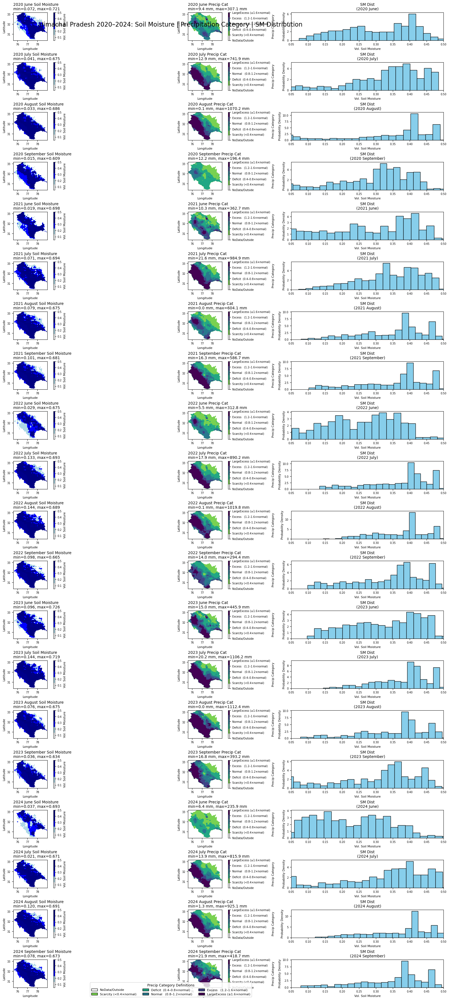

In [57]:
import os
import rasterio
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust as needed)
#    - Soil Moisture TIFF:          20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Raw Precipitation TIFF:      25 bands (2020–2024 × 5 bands each: June, July, August, September, Total)
#    - Precipitation Category TIFF: 25 bands (2020–2024 × 5 category bands)
#    - Himachal mask shapefile:     "SateMask/gadm41_IND_1.shp"  (contains all Indian states)
# -----------------------------------------------------------------------------
sm_tiff_path        = "Himachal_X_Soil_Moisture.tif"
precip_raw_tiff     = "Himachal_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff     = "Himachal_Y_Precipitation_GT_geotif.tif"
india_shapefile     = "SateMask/gadm41_IND_1.shp"

for path in (sm_tiff_path, precip_raw_tiff, precip_cat_tiff, india_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20-BAND SOIL MOISTURE TIFF
# -----------------------------------------------------------------------------
with rasterio.open(sm_tiff_path) as src_sm:
    sm_bands      = src_sm.read().astype(np.float32)  # shape = (20, H, W)
    sm_transform  = src_sm.transform
    sm_crs        = src_sm.crs
    height, width = src_sm.height, src_sm.width
    bounds        = src_sm.bounds

n_sm_bands = sm_bands.shape[0]
if n_sm_bands != 20:
    raise ValueError(f"Expected 20 bands in {sm_tiff_path}, but found {n_sm_bands}")

# 2a) Load Himachal Pradesh from the shapefile & reproject to match SM CRS
gdf = gpd.read_file(india_shapefile)
gdf_himachal = gdf[gdf["NAME_1"].str.lower() == "himachal pradesh"].copy()
if gdf_himachal.empty:
    raise ValueError("No feature named 'Himachal Pradesh' found in shapefile.")

if gdf_himachal.crs != sm_crs:
    gdf_himachal = gdf_himachal.to_crs(sm_crs)

# 2b) Build a single geometry for Himachal
#     Using union_all() to avoid unary_union deprecation
himachal_geom = [gdf_himachal.geometry.union_all()]

# 2c) Create boolean mask: True = inside Himachal
himachal_mask = geometry_mask(
    himachal_geom,
    transform=sm_transform,
    invert=True,
    out_shape=(height, width)
)

# 2d) Mask soil moisture bands outside Himachal → NaN
for i in range(n_sm_bands):
    band = sm_bands[i]
    band[~himachal_mask] = np.nan
    sm_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ THE 25-BAND RAW PRECIPITATION TIFF (in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff) as src_pr:
    pr_raw_full = src_pr.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw = pr_raw_full.shape[0]
if n_pr_raw != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff}, but found {n_pr_raw}")

# 3a) Mask raw precipitation outside Himachal → NaN
for i in range(n_pr_raw):
    arr = pr_raw_full[i]
    arr[~himachal_mask] = np.nan
    pr_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ THE 25-BAND PRECIPITATION CATEGORY TIFF (codes -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff) as src_pc:
    pr_cat_full = src_pc.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat = pr_cat_full.shape[0]
if n_pr_cat != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff}, but found {n_pr_cat}")

# 4a) Mask precip categories outside Himachal → code = -1
for i in range(n_pr_cat):
    arr = pr_cat_full[i]
    arr[~himachal_mask] = -1
    pr_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT ONLY THE 20 MONTHLY PRECIPITATION BANDS
#    (drop each year's “Total” at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_idx = []
for y in range(5):
    base = y * 5
    monthly_idx.extend([base + 0, base + 1, base + 2, base + 3])

pr_raw = pr_raw_full[monthly_idx, :, :]  # shape = (20, H, W)
pr_cat = pr_cat_full[monthly_idx, :, :]  # shape = (20, H, W)

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS ARRAYS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)       # 5
n_months    = len(month_names) # 4
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & STATISTICS
# -----------------------------------------------------------------------------
# 7a) Soil moisture colormap (5-step blue ramp)
sm_cmap = ListedColormap([
    "white",      # <0.05 (masked out)
    "lightblue",  # ~0.05–0.2
    "blue",       # ~0.2–0.3
    "darkblue",   # ~0.3–0.4
    "navy"        # ~0.4–0.5+
])
sm_vmin, sm_vmax = 0.05, 0.5

# 7b) Precip category colors (0..5 after shifting -1..4 → 0..5)
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside (orig code -1)
    "#79d151",  # 1 = Scarcity       (orig code 0)
    "#22a784",  # 2 = Deficit        (orig code 1)
    "#29788e",  # 3 = Normal         (orig code 2)
    "#404387",  # 4 = Excess         (orig code 3)
    "#440154"   # 5 = LargeExcess    (orig code 4)
]
pr_cmap = ListedColormap(cluster_colors)
pr_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
pr_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=pr_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 8) BUILD FIGURE: 20 ROWS × 3 COLUMNS
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    figsize=(20, n_total * 1.8),
    constrained_layout=True
)
fig.suptitle(
    "Himachal Pradesh 2020–2024: Soil Moisture | Precipitation Category | SM Distribution",
    fontsize=16, y=0.98
)

# If only one row, ensure axes is 2D
if n_total == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP OVER ALL 20 MONTHLY BANDS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total):
    yr_idx  = i // n_months
    mo_idx  = i % n_months
    year    = years[yr_idx]
    month   = month_names[mo_idx]

    # -- Soil moisture layer & stats (volumetric)
    sm_layer = sm_bands[i]
    valid_sm = sm_layer[~np.isnan(sm_layer)]
    if valid_sm.size > 0:
        sm_min = float(np.nanmin(valid_sm))
        sm_max = float(np.nanmax(valid_sm))
    else:
        sm_min = sm_max = None

    # -- Raw precip layer & stats (mm)
    raw_pr_layer = pr_raw[i]
    valid_pr = raw_pr_layer[~np.isnan(raw_pr_layer)]
    if valid_pr.size > 0:
        pr_min = float(np.nanmin(valid_pr))
        pr_max = float(np.nanmax(valid_pr))
    else:
        pr_min = pr_max = None

    # -- Precip category (shift -1..4 → 0..5)
    raw_cat = pr_cat[i]
    cat_plot = np.full(raw_cat.shape, 0, dtype=np.int8)
    mask_valid = (raw_cat != -1)
    cat_plot[mask_valid] = raw_cat[mask_valid] + 1

    # ----- Column 0: Soil Moisture Map -----
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        sm_layer,
        cmap=sm_cmap,
        vmin=sm_vmin,
        vmax=sm_vmax,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title0 = f"{year} {month} Soil Moisture\n"
    if (sm_min is not None) and (sm_max is not None):
        title0 += f"min={sm_min:.3f}, max={sm_max:.3f}"
    ax0.set_title(title0, fontsize=10, loc="left")
    ax0.set_xlabel("Longitude", fontsize=8)
    ax0.set_ylabel("Latitude", fontsize=8)
    ax0.tick_params(labelsize=7)

    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.046,
        pad=0.04
    )
    cbar0.set_label("Vol. Soil Moisture", fontsize=8)
    cbar0.ax.tick_params(labelsize=7)

    # ----- Column 1: Precipitation Category Map -----
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cat_plot,
        cmap=pr_cmap,
        vmin=0,
        vmax=5,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title1 = f"{year} {month} Precip Cat\n"
    if (pr_min is not None) and (pr_max is not None):
        title1 += f"min={pr_min:.1f} mm, max={pr_max:.1f} mm"
    ax1.set_title(title1, fontsize=10, loc="left")
    ax1.set_xlabel("Longitude", fontsize=8)
    ax1.set_ylabel("Latitude", fontsize=8)
    ax1.tick_params(labelsize=7)

    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.046,
        pad=0.04
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels([
        pr_labels[0],
        pr_labels[1],
        pr_labels[2],
        pr_labels[3],
        pr_labels[4],
        pr_labels[5]
    ], fontsize=7)
    cbar1.ax.tick_params(labelsize=7)
    cbar1.set_label("Precip Category", fontsize=8)

    # ----- Column 2: Soil Moisture Distribution (Histogram) -----
    ax2 = axes[i, 2]
    if valid_sm.size > 0:
        ax2.hist(
            valid_sm.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="skyblue"
        )
        ax2.set_xlim(sm_vmin, sm_vmax)
    else:
        ax2.text(
            0.5, 0.5, "No Data",
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=8,
            color='gray'
        )
    ax2.set_title(f"SM Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("Vol. Soil Moisture", fontsize=8)
    ax2.set_ylabel("Probability Density", fontsize=8)
    ax2.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 10) Legend for Precipitation Categories at Bottom Center
# -----------------------------------------------------------------------------
fig.legend(
    handles=pr_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, 0.00),
    fontsize=8,
    title_fontsize=9
)

plt.show()
